# 28. Final Controlled 50-Painting Evaluation Report

This notebook creates the final consolidated report for the controlled 50-painting restoration evaluation.

It combines the completed experimental outputs from:

- dataset preparation,
- synthetic damage generation,
- OpenCV Telea restoration,
- LaMa restoration,
- Stable Diffusion Inpainting restoration,
- SDXL feasibility audit,
- refined metric-region comparison,
- Stable Diffusion uncertainty analysis.

The goal is to produce one clear final report that explains the full evaluation framework and the main experimental findings.

This notebook does not generate new restorations. It consolidates, validates, visualizes, and interprets the completed results.

## Final report purpose

The final controlled evaluation report answers the thesis-level question:

> How can AI-assisted painting restoration models be evaluated in a trustworthy way?

The report is designed around three evaluation layers:

1. **Reference-based restoration quality**
   - How close is the restored image to the clean reference?

2. **Metric-region-aware comparison**
   - Are metrics evaluated on regions that match their assumptions?

3. **Generative uncertainty**
   - Does a diffusion model produce stable outputs across repeated seeds?

The final report does not claim that any model performs historically correct restoration. Instead, it evaluates how different restoration methods behave under controlled synthetic damage, reference-based metrics, and uncertainty diagnostics.

## Final thesis framing

The main thesis claim supported by this evaluation is:

> Visual plausibility is not the same as restoration trustworthiness.

A model may produce a visually coherent restoration while still being:

- less reference-faithful than another method,
- unstable across random seeds,
- sensitive to damage type,
- inconsistent across painting categories,
- unsuitable for conservation-style interpretation without uncertainty diagnostics.

The final report therefore combines quantitative metrics, visual examples, and uncertainty analysis rather than relying on a single model score.

In [1]:
from pathlib import Path
import sys
import base64
from datetime import datetime

import pandas as pd
import numpy as np
import yaml
from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import HTML, display

PROJECT_ROOT = Path.cwd().resolve()

if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

src_path = PROJECT_ROOT / "src"

if str(src_path) not in sys.path:
    sys.path.insert(0, str(src_path))

print("Project root:", PROJECT_ROOT)
print("Source path:", src_path)

Project root: D:\Masters\FH\Thesis\painting-restoration-eval
Source path: D:\Masters\FH\Thesis\painting-restoration-eval\src


In [2]:
config_path = PROJECT_ROOT / "config" / "experiment_50_config.yaml"

if not config_path.exists():
    raise FileNotFoundError(f"Config file not found: {config_path}")

with open(config_path, "r", encoding="utf-8") as file:
    config = yaml.safe_load(file)

paths_cfg = config["paths"]

processed_metadata_dir = PROJECT_ROOT / paths_cfg["processed_metadata_dir"]
metrics_dir = PROJECT_ROOT / paths_cfg["metrics_dir"]
figures_dir = PROJECT_ROOT / paths_cfg["figures_dir"]
reports_dir = PROJECT_ROOT / paths_cfg.get("reports_dir", "outputs/reports")

final_report_figures_dir = figures_dir / "final_controlled_50_report"
final_report_metrics_dir = metrics_dir
final_report_path = reports_dir / "final_controlled_50_evaluation_report.html"

final_report_figures_dir.mkdir(parents=True, exist_ok=True)
reports_dir.mkdir(parents=True, exist_ok=True)

print("Processed metadata dir:", processed_metadata_dir)
print("Metrics dir:", metrics_dir)
print("Figures dir:", figures_dir)
print("Reports dir:", reports_dir)
print("Final report figures dir:", final_report_figures_dir)
print("Final report path:", final_report_path)

Processed metadata dir: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\metadata
Metrics dir: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics
Figures dir: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures
Reports dir: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports
Final report figures dir: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\final_controlled_50_report
Final report path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\final_controlled_50_evaluation_report.html


In [3]:
input_paths = {
    # Dataset and restoration metadata
    "processed_metadata": processed_metadata_dir / "metadata_processed_clean.csv",
    "damage_metadata": processed_metadata_dir / "metadata_damaged_images.csv",
    "opencv_metadata": processed_metadata_dir / "metadata_restored_opencv_telea.csv",
    "lama_metadata": processed_metadata_dir / "metadata_restored_lama.csv",
    "stable_diffusion_metadata": processed_metadata_dir / "metadata_restored_stable_diffusion.csv",

    # Refined comparison outputs from Notebook 26
    "refined_comparison": metrics_dir / "comparison_unified_refined_opencv_lama_stable_diffusion_50.csv",
    "refined_win_rates": metrics_dir / "comparison_win_rates_refined_opencv_lama_stable_diffusion_50.csv",
    "refined_summary_by_mask_type": metrics_dir / "comparison_summary_by_mask_type_refined_opencv_lama_stable_diffusion_50.csv",
    "refined_summary_by_category": metrics_dir / "comparison_summary_by_category_refined_opencv_lama_stable_diffusion_50.csv",
    "refined_metric_disagreement": metrics_dir / "comparison_metric_disagreement_cases_refined_opencv_lama_stable_diffusion_50.csv",
    "old_vs_refined_policy": metrics_dir / "comparison_old_vs_refined_metric_policy_50.csv",
    "refined_visual_cases": metrics_dir / "comparison_visual_cases_refined_opencv_lama_stable_diffusion_50.csv",

    # Stable Diffusion uncertainty outputs from Notebook 27
    "uncertainty_subset_manifest": metrics_dir / "stable_diffusion_uncertainty_subset_manifest_50.csv",
    "uncertainty_generations": metrics_dir / "stable_diffusion_uncertainty_generations_50.csv",
    "uncertainty_image_by_case": metrics_dir / "stable_diffusion_uncertainty_image_summary_by_case_50.csv",
    "uncertainty_image_by_mask_type": metrics_dir / "stable_diffusion_uncertainty_image_summary_by_mask_type_50.csv",
    "uncertainty_image_by_category": metrics_dir / "stable_diffusion_uncertainty_image_summary_by_category_50.csv",
    "uncertainty_pairwise_lpips": metrics_dir / "stable_diffusion_uncertainty_pairwise_lpips_50.csv",
    "uncertainty_pairwise_feature": metrics_dir / "stable_diffusion_uncertainty_pairwise_feature_similarity_50.csv",
    "uncertainty_combined_by_case": metrics_dir / "stable_diffusion_uncertainty_combined_summary_by_case_50.csv",
    "uncertainty_combined_by_mask_type": metrics_dir / "stable_diffusion_uncertainty_combined_summary_by_mask_type_50.csv",
    "uncertainty_combined_by_category": metrics_dir / "stable_diffusion_uncertainty_combined_summary_by_category_50.csv",
    "uncertainty_vs_refined": metrics_dir / "stable_diffusion_uncertainty_vs_refined_performance_50.csv",
    "uncertainty_quadrants": metrics_dir / "stable_diffusion_uncertainty_performance_quadrants_50.csv",
    "uncertainty_visual_cases": metrics_dir / "stable_diffusion_uncertainty_visual_cases_50.csv",
    "uncertainty_trustworthiness_visual_cases": metrics_dir / "stable_diffusion_uncertainty_trustworthiness_visual_cases_50.csv",

    # Existing reports
    "opencv_report": reports_dir / "opencv_telea_report_50.html",
    "lama_report": reports_dir / "lama_report_50.html",
    "stable_diffusion_report": reports_dir / "stable_diffusion_inpainting_report_50.html",
    "refined_comparison_report": reports_dir / "opencv_lama_stable_diffusion_refined_metric_comparison_report_50.html",
    "uncertainty_report": reports_dir / "stable_diffusion_uncertainty_report_50.html",
}

for name, path in input_paths.items():
    print(f"{name}: {path}")

processed_metadata: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\metadata\metadata_processed_clean.csv
damage_metadata: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\metadata\metadata_damaged_images.csv
opencv_metadata: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\metadata\metadata_restored_opencv_telea.csv
lama_metadata: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\metadata\metadata_restored_lama.csv
stable_diffusion_metadata: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\metadata\metadata_restored_stable_diffusion.csv
refined_comparison: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_unified_refined_opencv_lama_stable_diffusion_50.csv
refined_win_rates: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_win_rates_refined_opencv_lama_stable_diffusion_50.csv
refined_summary_by_mask_type: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\compa

In [4]:
required_input_names = [
    "processed_metadata",
    "damage_metadata",
    "opencv_metadata",
    "lama_metadata",
    "stable_diffusion_metadata",
    "refined_comparison",
    "refined_win_rates",
    "refined_summary_by_mask_type",
    "refined_summary_by_category",
    "refined_metric_disagreement",
    "old_vs_refined_policy",
    "refined_visual_cases",
    "uncertainty_subset_manifest",
    "uncertainty_generations",
    "uncertainty_image_by_case",
    "uncertainty_image_by_mask_type",
    "uncertainty_image_by_category",
    "uncertainty_pairwise_lpips",
    "uncertainty_pairwise_feature",
    "uncertainty_combined_by_case",
    "uncertainty_combined_by_mask_type",
    "uncertainty_combined_by_category",
    "uncertainty_vs_refined",
    "uncertainty_quadrants",
    "uncertainty_visual_cases",
    "uncertainty_trustworthiness_visual_cases",
    "refined_comparison_report",
    "uncertainty_report",
]

missing_inputs = [
    (name, input_paths[name])
    for name in required_input_names
    if not input_paths[name].exists()
]

if missing_inputs:
    for name, path in missing_inputs:
        print(f"Missing {name}: {path}")
    raise FileNotFoundError("Some required final-report inputs are missing.")

print("All required final-report input files exist.")

All required final-report input files exist.


In [5]:
processed_metadata_df = pd.read_csv(input_paths["processed_metadata"])
damage_metadata_df = pd.read_csv(input_paths["damage_metadata"])
opencv_metadata_df = pd.read_csv(input_paths["opencv_metadata"])
lama_metadata_df = pd.read_csv(input_paths["lama_metadata"])
stable_diffusion_metadata_df = pd.read_csv(input_paths["stable_diffusion_metadata"])

refined_comparison_df = pd.read_csv(input_paths["refined_comparison"])
refined_win_rates_df = pd.read_csv(input_paths["refined_win_rates"])
refined_summary_by_mask_type_df = pd.read_csv(input_paths["refined_summary_by_mask_type"])
refined_summary_by_category_df = pd.read_csv(input_paths["refined_summary_by_category"])
refined_metric_disagreement_df = pd.read_csv(input_paths["refined_metric_disagreement"])
old_vs_refined_policy_df = pd.read_csv(input_paths["old_vs_refined_policy"])
refined_visual_cases_df = pd.read_csv(input_paths["refined_visual_cases"])

uncertainty_subset_manifest_df = pd.read_csv(input_paths["uncertainty_subset_manifest"])
uncertainty_generations_df = pd.read_csv(input_paths["uncertainty_generations"])
uncertainty_image_by_case_df = pd.read_csv(input_paths["uncertainty_image_by_case"])
uncertainty_image_by_mask_type_df = pd.read_csv(input_paths["uncertainty_image_by_mask_type"])
uncertainty_image_by_category_df = pd.read_csv(input_paths["uncertainty_image_by_category"])
uncertainty_pairwise_lpips_df = pd.read_csv(input_paths["uncertainty_pairwise_lpips"])
uncertainty_pairwise_feature_df = pd.read_csv(input_paths["uncertainty_pairwise_feature"])
uncertainty_combined_by_case_df = pd.read_csv(input_paths["uncertainty_combined_by_case"])
uncertainty_combined_by_mask_type_df = pd.read_csv(input_paths["uncertainty_combined_by_mask_type"])
uncertainty_combined_by_category_df = pd.read_csv(input_paths["uncertainty_combined_by_category"])
uncertainty_vs_refined_df = pd.read_csv(input_paths["uncertainty_vs_refined"])
uncertainty_quadrants_df = pd.read_csv(input_paths["uncertainty_quadrants"])
uncertainty_visual_cases_df = pd.read_csv(input_paths["uncertainty_visual_cases"])
uncertainty_trustworthiness_visual_cases_df = pd.read_csv(input_paths["uncertainty_trustworthiness_visual_cases"])

loaded_tables = {
    "processed_metadata": processed_metadata_df,
    "damage_metadata": damage_metadata_df,
    "opencv_metadata": opencv_metadata_df,
    "lama_metadata": lama_metadata_df,
    "stable_diffusion_metadata": stable_diffusion_metadata_df,
    "refined_comparison": refined_comparison_df,
    "refined_win_rates": refined_win_rates_df,
    "refined_summary_by_mask_type": refined_summary_by_mask_type_df,
    "refined_summary_by_category": refined_summary_by_category_df,
    "refined_metric_disagreement": refined_metric_disagreement_df,
    "old_vs_refined_policy": old_vs_refined_policy_df,
    "refined_visual_cases": refined_visual_cases_df,
    "uncertainty_subset_manifest": uncertainty_subset_manifest_df,
    "uncertainty_generations": uncertainty_generations_df,
    "uncertainty_combined_by_case": uncertainty_combined_by_case_df,
    "uncertainty_vs_refined": uncertainty_vs_refined_df,
}

for name, df in loaded_tables.items():
    print(f"{name}: {df.shape}")

processed_metadata: (50, 43)
damage_metadata: (250, 19)
opencv_metadata: (250, 20)
lama_metadata: (250, 32)
stable_diffusion_metadata: (250, 36)
refined_comparison: (200, 40)
refined_win_rates: (21, 6)
refined_summary_by_mask_type: (4, 24)
refined_summary_by_category: (5, 24)
refined_metric_disagreement: (124, 43)
old_vs_refined_policy: (200, 10)
refined_visual_cases: (62, 45)
uncertainty_subset_manifest: (40, 64)
uncertainty_generations: (160, 155)
uncertainty_combined_by_case: (40, 55)
uncertainty_vs_refined: (40, 75)


In [6]:
if len(processed_metadata_df) != 50:
    raise ValueError(f"Expected 50 processed paintings, found {len(processed_metadata_df)}.")

if len(damage_metadata_df) != 250:
    raise ValueError(f"Expected 250 damaged-image rows, found {len(damage_metadata_df)}.")

for model_name, df in [
    ("opencv_telea", opencv_metadata_df),
    ("lama", lama_metadata_df),
    ("stable_diffusion_inpainting", stable_diffusion_metadata_df),
]:
    if len(df) != 250:
        raise ValueError(f"Expected 250 restoration metadata rows for {model_name}, found {len(df)}.")

    if "status" in df.columns and (df["status"] != "ok").any():
        display(df[df["status"] != "ok"])
        raise ValueError(f"{model_name} metadata contains non-ok rows.")

if len(refined_comparison_df) != 200:
    raise ValueError(f"Expected 200 refined comparison rows, found {len(refined_comparison_df)}.")

if len(uncertainty_subset_manifest_df) != 40:
    raise ValueError(f"Expected 40 uncertainty subset rows, found {len(uncertainty_subset_manifest_df)}.")

if len(uncertainty_generations_df) != 160:
    raise ValueError(f"Expected 160 uncertainty generation rows, found {len(uncertainty_generations_df)}.")

if len(uncertainty_pairwise_lpips_df) != 240:
    raise ValueError(f"Expected 240 pairwise LPIPS rows, found {len(uncertainty_pairwise_lpips_df)}.")

if len(uncertainty_pairwise_feature_df) != 240:
    raise ValueError(f"Expected 240 pairwise feature rows, found {len(uncertainty_pairwise_feature_df)}.")

if len(uncertainty_combined_by_case_df) != 40:
    raise ValueError(f"Expected 40 combined uncertainty rows, found {len(uncertainty_combined_by_case_df)}.")

expected_damage_mask_counts = {
    "zero_control": 50,
    "scratch_thin": 50,
    "loss_small": 50,
    "loss_large": 50,
    "mixed_damage": 50,
}

actual_damage_mask_counts = damage_metadata_df["mask_type"].value_counts().to_dict()

for mask_type, expected_count in expected_damage_mask_counts.items():
    actual_count = actual_damage_mask_counts.get(mask_type, 0)

    if actual_count != expected_count:
        raise ValueError(
            f"Damage metadata mask type {mask_type!r}: expected {expected_count}, found {actual_count}."
        )

expected_refined_mask_counts = {
    "scratch_thin": 50,
    "loss_small": 50,
    "loss_large": 50,
    "mixed_damage": 50,
}

actual_refined_mask_counts = refined_comparison_df["mask_type"].value_counts().to_dict()

for mask_type, expected_count in expected_refined_mask_counts.items():
    actual_count = actual_refined_mask_counts.get(mask_type, 0)

    if actual_count != expected_count:
        raise ValueError(
            f"Refined comparison mask type {mask_type!r}: expected {expected_count}, found {actual_count}."
        )

expected_categories = {
    "portrait_figure": 10,
    "landscape_natural": 10,
    "architecture_structured": 10,
    "abstraction_surrealism": 10,
    "high_texture_brushwork": 10,
}

actual_processed_category_counts = processed_metadata_df["category"].value_counts().to_dict()

for category, expected_count in expected_categories.items():
    actual_count = actual_processed_category_counts.get(category, 0)

    if actual_count != expected_count:
        raise ValueError(
            f"Processed metadata category {category!r}: expected {expected_count}, found {actual_count}."
        )

print("Final report input validation gates passed.")

Final report input validation gates passed.


In [7]:
def resolve_project_path(path_value: str | Path) -> Path:
    path = Path(str(path_value))

    if path.is_absolute():
        return path

    return PROJECT_ROOT / path


def image_to_base64_data_uri(path_value: str | Path) -> str:
    path = resolve_project_path(path_value)

    if not path.exists():
        return ""

    suffix = path.suffix.lower()

    if suffix in [".jpg", ".jpeg"]:
        mime_type = "image/jpeg"
    else:
        mime_type = "image/png"

    encoded = base64.b64encode(path.read_bytes()).decode("utf-8")
    return f"data:{mime_type};base64,{encoded}"


def render_embedded_image(
    path_value: str | Path,
    *,
    alt_text: str = "",
    css_class: str = "report-image",
) -> str:
    data_uri = image_to_base64_data_uri(path_value)

    if not data_uri:
        return f"<p class='missing-image'>Missing image: {path_value}</p>"

    return f'<img class="{css_class}" src="{data_uri}" alt="{alt_text}">'


def dataframe_to_html_table(
    df: pd.DataFrame,
    *,
    max_rows: int | None = None,
    float_precision: int = 4,
    table_class: str = "data-table",
) -> str:
    display_df = df.copy()

    if max_rows is not None:
        display_df = display_df.head(max_rows).copy()

    for column in display_df.select_dtypes(include=[np.number]).columns:
        display_df[column] = display_df[column].map(
            lambda value: f"{value:.{float_precision}f}" if pd.notna(value) else ""
        )

    return display_df.to_html(
        index=False,
        escape=False,
        classes=table_class,
        border=0,
    )


print("Final report helpers ready.")

Final report helpers ready.


## Final synthesis tables

This section creates consolidated tables for the final controlled 50-painting evaluation report.

The goal is to summarize the completed experiment in a way that can be used directly in the thesis:

- dataset design,
- synthetic damage design,
- evaluated model stack,
- metric-region policy,
- refined model comparison,
- Stable Diffusion uncertainty analysis,
- SDXL feasibility decision,
- final key findings.

These tables are saved as standalone CSV files and later embedded in the final HTML report.

In [8]:
final_output_paths = {
    "dataset_summary": final_report_metrics_dir / "final_controlled_50_dataset_summary.csv",
    "model_stack_summary": final_report_metrics_dir / "final_controlled_50_model_stack_summary.csv",
    "metric_policy_summary": final_report_metrics_dir / "final_controlled_50_metric_policy_summary.csv",
    "key_results_summary": final_report_metrics_dir / "final_controlled_50_key_results_summary.csv",
    "model_win_summary": final_report_metrics_dir / "final_controlled_50_model_win_summary.csv",
    "uncertainty_summary": final_report_metrics_dir / "final_controlled_50_uncertainty_summary.csv",
    "sdxl_feasibility_summary": final_report_metrics_dir / "final_controlled_50_sdxl_feasibility_summary.csv",
    "final_visual_cases": final_report_metrics_dir / "final_controlled_50_visual_cases.csv",
}

for name, path in final_output_paths.items():
    print(f"{name}: {path}")

dataset_summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_dataset_summary.csv
model_stack_summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_model_stack_summary.csv
metric_policy_summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_metric_policy_summary.csv
key_results_summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_key_results_summary.csv
model_win_summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_model_win_summary.csv
uncertainty_summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_uncertainty_summary.csv
sdxl_feasibility_summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_sdxl_feasibility_summary.csv
final_visual_cases: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50

In [9]:
category_summary_df = (
    processed_metadata_df
    .groupby("category", dropna=False)
    .agg(
        paintings=("painting_id", "count"),
    )
    .reset_index()
    .sort_values("category")
)

mask_summary_df = (
    damage_metadata_df
    .groupby("mask_type", dropna=False)
    .agg(
        damaged_cases=("case_id", "count"),
        paintings=("painting_id", "nunique"),
    )
    .reset_index()
    .sort_values("mask_type")
)

dataset_summary_rows = [
    {
        "section": "dataset",
        "item": "total_paintings",
        "value": len(processed_metadata_df),
        "description": "Controlled painting subset used for the final local evaluation.",
    },
    {
        "section": "dataset",
        "item": "painting_categories",
        "value": processed_metadata_df["category"].nunique(),
        "description": "Five controlled painting categories.",
    },
    {
        "section": "dataset",
        "item": "paintings_per_category",
        "value": "10",
        "description": "Each category contributes ten paintings.",
    },
    {
        "section": "damage",
        "item": "total_damage_cases",
        "value": len(damage_metadata_df),
        "description": "50 paintings × 5 mask types.",
    },
    {
        "section": "damage",
        "item": "non_zero_damage_cases",
        "value": int((damage_metadata_df["mask_type"] != "zero_control").sum()),
        "description": "Cases used for local restoration comparison.",
    },
    {
        "section": "damage",
        "item": "zero_control_cases",
        "value": int((damage_metadata_df["mask_type"] == "zero_control").sum()),
        "description": "No-damage control cases.",
    },
    {
        "section": "damage",
        "item": "mask_types",
        "value": damage_metadata_df["mask_type"].nunique(),
        "description": "zero_control, scratch_thin, loss_small, loss_large, mixed_damage.",
    },
]

dataset_summary_df = pd.DataFrame(dataset_summary_rows)
dataset_summary_df.to_csv(final_output_paths["dataset_summary"], index=False)

print("Saved dataset summary:", final_output_paths["dataset_summary"])

print("\nCategory summary:")
display(category_summary_df)

print("\nMask summary:")
display(mask_summary_df)

print("\nDataset summary:")
display(dataset_summary_df)

Saved dataset summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_dataset_summary.csv

Category summary:


,category,paintings
0,abstraction_surrealism,10
1,architecture_structured,10
2,high_texture_brushwork,10
3,landscape_natural,10
4,portrait_figure,10



Mask summary:


,mask_type,damaged_cases,paintings
0,loss_large,50,50
1,loss_small,50,50
2,mixed_damage,50,50
3,scratch_thin,50,50
4,zero_control,50,50



Dataset summary:


,section,item,value,description
0,dataset,total_paintings,50,Controlled painting subset used for the final ...
1,dataset,painting_categories,5,Five controlled painting categories.
2,dataset,paintings_per_category,10,Each category contributes ten paintings.
3,damage,total_damage_cases,250,50 paintings × 5 mask types.
4,damage,non_zero_damage_cases,200,Cases used for local restoration comparison.
5,damage,zero_control_cases,50,No-damage control cases.
6,damage,mask_types,5,"zero_control, scratch_thin, loss_small, loss_l..."


In [10]:
model_stack_summary_df = pd.DataFrame(
    [
        {
            "model_name": "opencv_telea",
            "display_name": "OpenCV Telea",
            "model_type": "classical inpainting baseline",
            "evaluation_status": "fully_evaluated",
            "cases_restored": len(opencv_metadata_df),
            "non_zero_cases_compared": 200,
            "role_in_framework": "deterministic classical baseline",
            "main_interpretation": (
                "Useful baseline for local interpolation behavior; limited semantic restoration capacity."
            ),
        },
        {
            "model_name": "lama",
            "display_name": "LaMa",
            "model_type": "deep learning inpainting model",
            "evaluation_status": "fully_evaluated",
            "cases_restored": len(lama_metadata_df),
            "non_zero_cases_compared": 200,
            "role_in_framework": "strong reference-based inpainting model",
            "main_interpretation": (
                "Dominated the refined reference-based metric comparison across most cases."
            ),
        },
        {
            "model_name": "stable_diffusion_inpainting",
            "display_name": "Stable Diffusion Inpainting",
            "model_type": "latent diffusion inpainting model",
            "evaluation_status": "fully_evaluated_plus_uncertainty_analysis",
            "cases_restored": len(stable_diffusion_metadata_df),
            "non_zero_cases_compared": 200,
            "role_in_framework": "generative restoration candidate",
            "main_interpretation": (
                "Can produce visually plausible completions but is less reference-faithful and may be unstable across seeds."
            ),
        },
        {
            "model_name": "sdxl_inpainting",
            "display_name": "SDXL Inpainting",
            "model_type": "larger latent diffusion inpainting model",
            "evaluation_status": "feasibility_audit_only",
            "cases_restored": "smoke/probe only",
            "non_zero_cases_compared": 0,
            "role_in_framework": "excluded local full-evaluation candidate",
            "main_interpretation": (
                "Excluded from full local evaluation due runtime and 6GB VRAM feasibility constraints."
            ),
        },
    ]
)

model_stack_summary_df.to_csv(final_output_paths["model_stack_summary"], index=False)

print("Saved model stack summary:", final_output_paths["model_stack_summary"])
display(model_stack_summary_df)

Saved model stack summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_model_stack_summary.csv


,model_name,display_name,model_type,evaluation_status,cases_restored,non_zero_cases_compared,role_in_framework,main_interpretation
0,opencv_telea,OpenCV Telea,classical inpainting baseline,fully_evaluated,250,200,deterministic classical baseline,Useful baseline for local interpolation behavi...
1,lama,LaMa,deep learning inpainting model,fully_evaluated,250,200,strong reference-based inpainting model,Dominated the refined reference-based metric c...
2,stable_diffusion_inpainting,Stable Diffusion Inpainting,latent diffusion inpainting model,fully_evaluated_plus_uncertainty_analysis,250,200,generative restoration candidate,Can produce visually plausible completions but...
3,sdxl_inpainting,SDXL Inpainting,larger latent diffusion inpainting model,feasibility_audit_only,smoke/probe only,0,excluded local full-evaluation candidate,Excluded from full local evaluation due runtim...


In [11]:
metric_policy_summary_df = pd.DataFrame(
    [
        {
            "metric": "MSE improvement",
            "final_local_region": "masked_region",
            "reason": "Direct pixel-error metric; suitable for sparse damaged pixels.",
            "used_in_final_comparison": True,
        },
        {
            "metric": "PSNR improvement",
            "final_local_region": "masked_region",
            "reason": "Derived from pixel error; suitable for sparse damaged pixels.",
            "used_in_final_comparison": True,
        },
        {
            "metric": "SSIM improvement",
            "final_local_region": "mask_bbox_crop",
            "reason": "Structural metric requiring image-like local context; sparse masked-region SSIM was invalid.",
            "used_in_final_comparison": True,
        },
        {
            "metric": "LPIPS improvement",
            "final_local_region": "mask_bbox_crop",
            "reason": "Perceptual metric requiring image-like input.",
            "used_in_final_comparison": True,
        },
        {
            "metric": "CLIP similarity improvement",
            "final_local_region": "mask_bbox_crop",
            "reason": "Feature metric requiring image-like crop around the restored region.",
            "used_in_final_comparison": True,
        },
        {
            "metric": "DINOv2 similarity improvement",
            "final_local_region": "mask_bbox_crop",
            "reason": "Feature metric requiring image-like crop around the restored region.",
            "used_in_final_comparison": True,
        },
    ]
)

metric_policy_summary_df.to_csv(final_output_paths["metric_policy_summary"], index=False)

print("Saved metric policy summary:", final_output_paths["metric_policy_summary"])
display(metric_policy_summary_df)

Saved metric policy summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_metric_policy_summary.csv


,metric,final_local_region,reason,used_in_final_comparison
0,MSE improvement,masked_region,Direct pixel-error metric; suitable for sparse...,True
1,PSNR improvement,masked_region,Derived from pixel error; suitable for sparse ...,True
2,SSIM improvement,mask_bbox_crop,Structural metric requiring image-like local c...,True
3,LPIPS improvement,mask_bbox_crop,Perceptual metric requiring image-like input.,True
4,CLIP similarity improvement,mask_bbox_crop,Feature metric requiring image-like crop aroun...,True
5,DINOv2 similarity improvement,mask_bbox_crop,Feature metric requiring image-like crop aroun...,True


In [12]:
# Build total model-win table from refined comparison.
model_names = [
    "opencv_telea",
    "lama",
    "stable_diffusion_inpainting",
]

model_display_names = {
    "opencv_telea": "OpenCV Telea",
    "lama": "LaMa",
    "stable_diffusion_inpainting": "Stable Diffusion Inpainting",
}

model_win_rows = []

for model_name in model_names:
    metric_win_column = f"{model_name}_metric_wins"

    if metric_win_column not in refined_comparison_df.columns:
        raise ValueError(f"Missing metric win column: {metric_win_column}")

    majority_vote_count = int((refined_comparison_df["overall_metric_vote"] == model_name).sum())
    total_metric_wins = int(refined_comparison_df[metric_win_column].sum())

    model_win_rows.append(
        {
            "model_name": model_name,
            "display_name": model_display_names[model_name],
            "total_metric_wins": total_metric_wins,
            "majority_vote_cases": majority_vote_count,
            "majority_vote_rate": majority_vote_count / len(refined_comparison_df),
            "mean_metric_wins_per_case": refined_comparison_df[metric_win_column].mean(),
        }
    )

tie_or_other_votes = refined_comparison_df[
    ~refined_comparison_df["overall_metric_vote"].isin(model_names)
]["overall_metric_vote"].value_counts(dropna=False)

for vote_name, count in tie_or_other_votes.items():
    model_win_rows.append(
        {
            "model_name": str(vote_name),
            "display_name": str(vote_name),
            "total_metric_wins": np.nan,
            "majority_vote_cases": int(count),
            "majority_vote_rate": int(count) / len(refined_comparison_df),
            "mean_metric_wins_per_case": np.nan,
        }
    )

model_win_summary_df = (
    pd.DataFrame(model_win_rows)
    .sort_values("majority_vote_cases", ascending=False)
    .reset_index(drop=True)
)

model_win_summary_df.to_csv(final_output_paths["model_win_summary"], index=False)

print("Saved model win summary:", final_output_paths["model_win_summary"])
display(model_win_summary_df)

Saved model win summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_model_win_summary.csv


,model_name,display_name,total_metric_wins,majority_vote_cases,majority_vote_rate,mean_metric_wins_per_case
0,lama,LaMa,924.0,155,0.775,4.620
1,tie_lama_opencv_telea,tie_lama_opencv_telea,NaN,23,0.115,NaN
2,opencv_telea,OpenCV Telea,257.0,21,0.105,1.285
3,stable_diffusion_inpainting,Stable Diffusion Inpainting,19.0,1,0.005,0.095


In [13]:
winner_columns = [
    "winner_mse_improvement",
    "winner_psnr_improvement",
    "winner_ssim_improvement",
    "winner_lpips_improvement",
    "winner_clip_improvement",
    "winner_dinov2_improvement",
]

available_winner_columns = [
    column for column in winner_columns
    if column in refined_comparison_df.columns
]

if len(available_winner_columns) != len(winner_columns):
    missing_winner_columns = sorted(set(winner_columns) - set(available_winner_columns))
    raise ValueError(f"Missing winner columns: {missing_winner_columns}")

per_metric_winner_rows = []

for winner_column in available_winner_columns:
    metric_name = winner_column.replace("winner_", "")

    counts = (
        refined_comparison_df[winner_column]
        .value_counts(dropna=False)
        .reset_index()
    )

    counts.columns = ["winner", "cases"]

    for _, row in counts.iterrows():
        per_metric_winner_rows.append(
            {
                "metric": metric_name,
                "winner": row["winner"],
                "cases": int(row["cases"]),
                "case_rate": int(row["cases"]) / len(refined_comparison_df),
            }
        )

per_metric_winner_summary_df = pd.DataFrame(per_metric_winner_rows)

per_metric_winner_summary_path = (
    final_report_metrics_dir / "final_controlled_50_per_metric_winner_summary.csv"
)

per_metric_winner_summary_df.to_csv(per_metric_winner_summary_path, index=False)

print("Saved per-metric winner summary:", per_metric_winner_summary_path)
display(per_metric_winner_summary_df)

Saved per-metric winner summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_per_metric_winner_summary.csv


,metric,winner,cases,case_rate
0,mse_improvement,lama,159,0.795
1,mse_improvement,opencv_telea,40,0.200
2,mse_improvement,stable_diffusion_inpainting,1,0.005
3,psnr_improvement,lama,159,0.795
4,psnr_improvement,opencv_telea,40,0.200
5,psnr_improvement,stable_diffusion_inpainting,1,0.005
6,ssim_improvement,opencv_telea,113,0.565
7,ssim_improvement,lama,87,0.435
8,lpips_improvement,lama,182,0.910
9,lpips_improvement,opencv_telea,12,0.060


In [14]:
highest_uncertainty_case = uncertainty_combined_by_case_df.sort_values(
    "combined_uncertainty_index",
    ascending=False,
).iloc[0]

lowest_uncertainty_case = uncertainty_combined_by_case_df.sort_values(
    "combined_uncertainty_index",
    ascending=True,
).iloc[0]

highest_uncertainty_mask_type = uncertainty_combined_by_mask_type_df.sort_values(
    "mean_combined_uncertainty_index",
    ascending=False,
).iloc[0]

highest_uncertainty_category = uncertainty_combined_by_category_df.sort_values(
    "mean_combined_uncertainty_index",
    ascending=False,
).iloc[0]

uncertainty_summary_df = pd.DataFrame(
    [
        {
            "item": "uncertainty_cases",
            "value": len(uncertainty_combined_by_case_df),
            "description": "Balanced diagnostic uncertainty subset.",
        },
        {
            "item": "uncertainty_generated_outputs",
            "value": len(uncertainty_generations_df),
            "description": "40 cases × 4 seeds.",
        },
        {
            "item": "pairwise_lpips_comparisons",
            "value": len(uncertainty_pairwise_lpips_df),
            "description": "Six pairwise seed comparisons per case.",
        },
        {
            "item": "pairwise_feature_comparisons",
            "value": len(uncertainty_pairwise_feature_df),
            "description": "CLIP and DINOv2 pairwise seed comparisons.",
        },
        {
            "item": "highest_uncertainty_case",
            "value": highest_uncertainty_case["original_case_id"],
            "description": (
                f"{highest_uncertainty_case['category']} | "
                f"{highest_uncertainty_case['mask_type']} | "
                f"index={highest_uncertainty_case['combined_uncertainty_index']:.4f}"
            ),
        },
        {
            "item": "lowest_uncertainty_case",
            "value": lowest_uncertainty_case["original_case_id"],
            "description": (
                f"{lowest_uncertainty_case['category']} | "
                f"{lowest_uncertainty_case['mask_type']} | "
                f"index={lowest_uncertainty_case['combined_uncertainty_index']:.4f}"
            ),
        },
        {
            "item": "highest_uncertainty_mask_type",
            "value": highest_uncertainty_mask_type["mask_type"],
            "description": (
                f"mean index={highest_uncertainty_mask_type['mean_combined_uncertainty_index']:.4f}"
            ),
        },
        {
            "item": "highest_uncertainty_category",
            "value": highest_uncertainty_category["category"],
            "description": (
                f"mean index={highest_uncertainty_category['mean_combined_uncertainty_index']:.4f}"
            ),
        },
    ]
)

uncertainty_summary_df.to_csv(final_output_paths["uncertainty_summary"], index=False)

print("Saved final uncertainty summary:", final_output_paths["uncertainty_summary"])
display(uncertainty_summary_df)

Saved final uncertainty summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_uncertainty_summary.csv


,item,value,description
0,uncertainty_cases,40,Balanced diagnostic uncertainty subset.
1,uncertainty_generated_outputs,160,40 cases × 4 seeds.
2,pairwise_lpips_comparisons,240,Six pairwise seed comparisons per case.
3,pairwise_feature_comparisons,240,CLIP and DINOv2 pairwise seed comparisons.
4,highest_uncertainty_case,p011_loss_large,landscape_natural | loss_large | index=0.9834
5,lowest_uncertainty_case,p011_scratch_thin,landscape_natural | scratch_thin | index=0.0043
6,highest_uncertainty_mask_type,loss_large,mean index=0.5175
7,highest_uncertainty_category,landscape_natural,mean index=0.3130


In [15]:
sdxl_feasibility_summary_df = pd.DataFrame(
    [
        {
            "aspect": "model",
            "finding": "SDXL Inpainting feasibility audit",
            "details": "diffusers/stable-diffusion-xl-1.0-inpainting-0.1 was tested locally.",
        },
        {
            "aspect": "local_hardware",
            "finding": "6GB GPU limitation",
            "details": "RTX 3060 Laptop GPU with 6GB VRAM was insufficient for practical full SDXL evaluation.",
        },
        {
            "aspect": "no_offload_result",
            "finding": "CUDA out-of-memory",
            "details": "Pipeline loading/inference without CPU offload exceeded available local VRAM.",
        },
        {
            "aspect": "cpu_offload_result",
            "finding": "Technically possible but too slow",
            "details": "Low-quality SDXL probe required several minutes per image, making full controlled evaluation impractical locally.",
        },
        {
            "aspect": "quality_runtime_tradeoff",
            "finding": "Excluded from full local comparison",
            "details": "Faster low-step settings were not adequate for restoration-quality comparison; stronger settings were too slow.",
        },
        {
            "aspect": "interpretation",
            "finding": "Feasibility exclusion, not model-quality conclusion",
            "details": "SDXL was excluded because of local compute constraints, not because of a full comparative quality evaluation.",
        },
        {
            "aspect": "future_work",
            "finding": "Remote GPU possible",
            "details": "Full SDXL evaluation can be revisited with 12GB+ VRAM, preferably 16GB+.",
        },
    ]
)

sdxl_feasibility_summary_df.to_csv(
    final_output_paths["sdxl_feasibility_summary"],
    index=False,
)

print("Saved SDXL feasibility summary:", final_output_paths["sdxl_feasibility_summary"])
display(sdxl_feasibility_summary_df)

Saved SDXL feasibility summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_sdxl_feasibility_summary.csv


,aspect,finding,details
0,model,SDXL Inpainting feasibility audit,diffusers/stable-diffusion-xl-1.0-inpainting-0...
1,local_hardware,6GB GPU limitation,RTX 3060 Laptop GPU with 6GB VRAM was insuffic...
2,no_offload_result,CUDA out-of-memory,Pipeline loading/inference without CPU offload...
3,cpu_offload_result,Technically possible but too slow,Low-quality SDXL probe required several minute...
4,quality_runtime_tradeoff,Excluded from full local comparison,Faster low-step settings were not adequate for...
5,interpretation,"Feasibility exclusion, not model-quality concl...",SDXL was excluded because of local compute con...
6,future_work,Remote GPU possible,Full SDXL evaluation can be revisited with 12G...


In [16]:
lama_majority_cases = int((refined_comparison_df["overall_metric_vote"] == "lama").sum())
opencv_majority_cases = int((refined_comparison_df["overall_metric_vote"] == "opencv_telea").sum())
sd_majority_cases = int(
    (refined_comparison_df["overall_metric_vote"] == "stable_diffusion_inpainting").sum()
)

total_refined_cases = len(refined_comparison_df)

key_results_summary_df = pd.DataFrame(
    [
        {
            "finding_id": "F1",
            "finding": "Balanced controlled benchmark completed",
            "evidence": "50 paintings, 5 painting categories, 250 damage cases, 200 non-zero local comparison cases.",
            "thesis_interpretation": "The experiment provides a controlled basis for comparing restoration behavior across categories and damage types.",
        },
        {
            "finding_id": "F2",
            "finding": "LaMa dominates refined reference-based comparison",
            "evidence": (
                f"LaMa won the refined majority vote in {lama_majority_cases}/{total_refined_cases} "
                f"non-zero cases."
            ),
            "thesis_interpretation": "Deep inpainting can outperform both classical interpolation and diffusion generation under reference-based metrics.",
        },
        {
            "finding_id": "F3",
            "finding": "OpenCV Telea remains useful as deterministic baseline",
            "evidence": (
                f"OpenCV Telea won the refined majority vote in {opencv_majority_cases}/{total_refined_cases} "
                f"non-zero cases."
            ),
            "thesis_interpretation": "Classical methods remain useful for baseline comparison and can still win some controlled cases.",
        },
        {
            "finding_id": "F4",
            "finding": "Stable Diffusion rarely wins reference-based majority vote",
            "evidence": (
                f"Stable Diffusion won the refined majority vote in {sd_majority_cases}/{total_refined_cases} "
                f"non-zero cases."
            ),
            "thesis_interpretation": "Visual generative plausibility does not necessarily align with reference-faithful restoration.",
        },
        {
            "finding_id": "F5",
            "finding": "Metric-region policy affects validity",
            "evidence": "Sparse masked-region SSIM was invalid and was moved to mask_bbox_crop in the refined comparison.",
            "thesis_interpretation": "Evaluation frameworks must align metric choice with spatial region and metric assumptions.",
        },
        {
            "finding_id": "F6",
            "finding": "Stable Diffusion uncertainty exposes generative instability",
            "evidence": "40 cases were sampled with 4 seeds each, producing 160 outputs and multi-metric uncertainty summaries.",
            "thesis_interpretation": "Diffusion restoration should be evaluated for stability across seeds, not only single-output visual quality.",
        },
        {
            "finding_id": "F7",
            "finding": "Uncertainty and reference performance are complementary",
            "evidence": "Uncertainty-performance quadrants distinguish unstable weak cases, unstable stronger cases, consistently weak cases, and relatively reliable cases.",
            "thesis_interpretation": "Trustworthiness requires both reference-based accuracy and generative stability diagnostics.",
        },
        {
            "finding_id": "F8",
            "finding": "SDXL excluded from full local evaluation",
            "evidence": "SDXL feasibility audit showed local 6GB VRAM/runtime constraints.",
            "thesis_interpretation": "The final controlled comparison is limited to feasible local models; SDXL remains future remote-compute work.",
        },
    ]
)

key_results_summary_df.to_csv(final_output_paths["key_results_summary"], index=False)

print("Saved final key results summary:", final_output_paths["key_results_summary"])
display(key_results_summary_df)

Saved final key results summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_key_results_summary.csv


,finding_id,finding,evidence,thesis_interpretation
0,F1,Balanced controlled benchmark completed,"50 paintings, 5 painting categories, 250 damag...",The experiment provides a controlled basis for...
1,F2,LaMa dominates refined reference-based comparison,LaMa won the refined majority vote in 155/200 ...,Deep inpainting can outperform both classical ...
2,F3,OpenCV Telea remains useful as deterministic b...,OpenCV Telea won the refined majority vote in ...,Classical methods remain useful for baseline c...
3,F4,Stable Diffusion rarely wins reference-based m...,Stable Diffusion won the refined majority vote...,Visual generative plausibility does not necess...
4,F5,Metric-region policy affects validity,Sparse masked-region SSIM was invalid and was ...,Evaluation frameworks must align metric choice...
5,F6,Stable Diffusion uncertainty exposes generativ...,"40 cases were sampled with 4 seeds each, produ...",Diffusion restoration should be evaluated for ...
6,F7,Uncertainty and reference performance are comp...,Uncertainty-performance quadrants distinguish ...,Trustworthiness requires both reference-based ...
7,F8,SDXL excluded from full local evaluation,SDXL feasibility audit showed local 6GB VRAM/r...,The final controlled comparison is limited to ...


## Final report charts

This section creates summary charts for the final controlled evaluation report.

The charts focus on the final consolidated findings:

- refined majority-vote model comparison,
- refined metric wins,
- mask-type comparison,
- category comparison,
- uncertainty by mask type,
- uncertainty by category,
- uncertainty-performance quadrants.

These charts are saved under `outputs/figures/final_controlled_50_report/`.

In [17]:
def save_bar_chart(
    labels,
    values,
    *,
    title: str,
    xlabel: str,
    ylabel: str,
    output_path: Path,
    rotation: int = 30,
) -> Path:
    plt.figure(figsize=(10, 5))
    plt.bar(labels, values)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=rotation, ha="right")
    plt.tight_layout()
    plt.savefig(output_path, dpi=170)
    plt.show()

    return output_path


print("Final chart helper ready.")

Final chart helper ready.


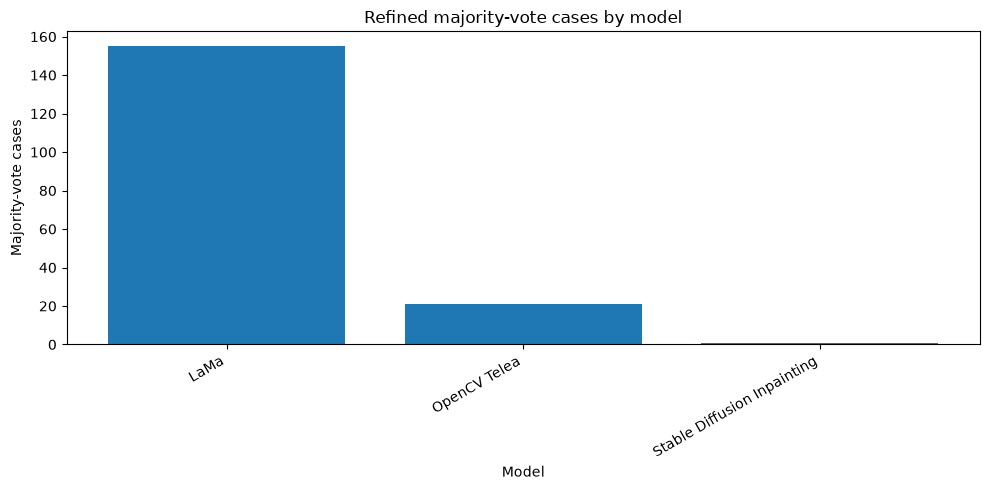

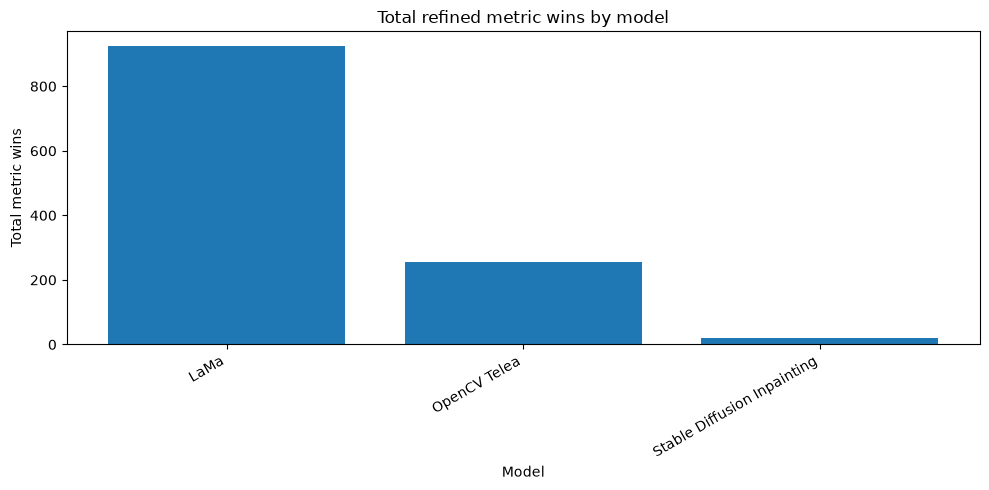

Saved majority-vote chart: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\final_controlled_50_report\final_majority_vote_cases_by_model.png
Saved metric-win chart: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\final_controlled_50_report\final_total_metric_wins_by_model.png


In [18]:
majority_vote_chart_path = final_report_figures_dir / "final_majority_vote_cases_by_model.png"
metric_win_chart_path = final_report_figures_dir / "final_total_metric_wins_by_model.png"

model_only_win_summary_df = model_win_summary_df[
    model_win_summary_df["model_name"].isin(model_names)
].copy()

save_bar_chart(
    model_only_win_summary_df["display_name"],
    model_only_win_summary_df["majority_vote_cases"],
    title="Refined majority-vote cases by model",
    xlabel="Model",
    ylabel="Majority-vote cases",
    output_path=majority_vote_chart_path,
)

save_bar_chart(
    model_only_win_summary_df["display_name"],
    model_only_win_summary_df["total_metric_wins"],
    title="Total refined metric wins by model",
    xlabel="Model",
    ylabel="Total metric wins",
    output_path=metric_win_chart_path,
)

print("Saved majority-vote chart:", majority_vote_chart_path)
print("Saved metric-win chart:", metric_win_chart_path)

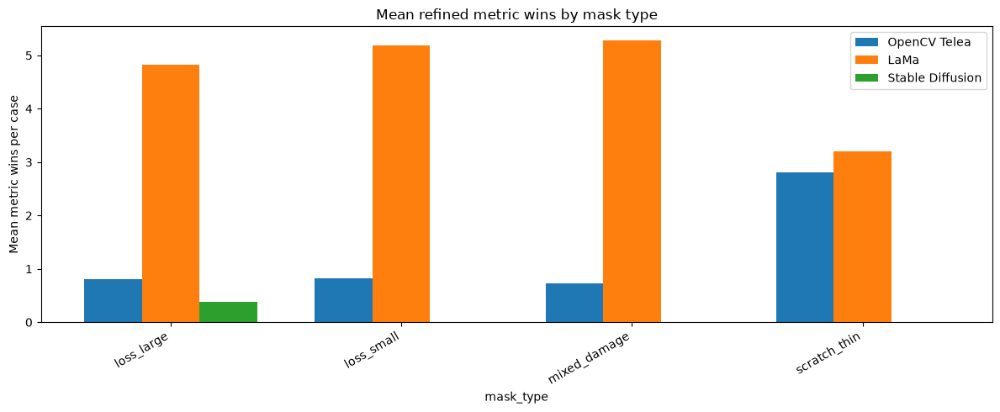

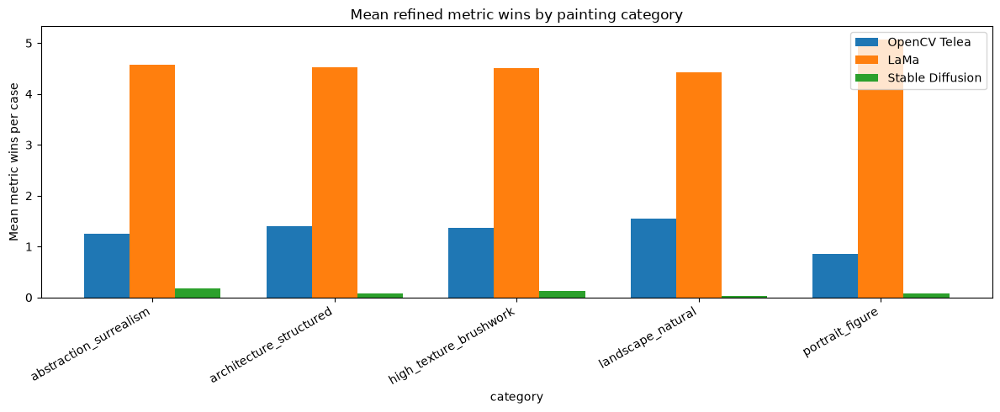

Saved mask summary chart: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\final_controlled_50_report\final_mean_metric_wins_by_mask_type.png
Saved category summary chart: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\final_controlled_50_report\final_mean_metric_wins_by_category.png


,mask_type,cases,mean_opencv_telea_metric_wins,mean_lama_metric_wins,mean_stable_diffusion_inpainting_metric_wins
0,loss_large,50,0.80,4.82,0.38
1,loss_small,50,0.82,5.18,0.00
2,mixed_damage,50,0.72,5.28,0.00
3,scratch_thin,50,2.80,3.20,0.00


,category,cases,mean_opencv_telea_metric_wins,mean_lama_metric_wins,mean_stable_diffusion_inpainting_metric_wins
0,abstraction_surrealism,40,1.250,4.575,0.175
1,architecture_structured,40,1.400,4.525,0.075
2,high_texture_brushwork,40,1.375,4.500,0.125
3,landscape_natural,40,1.550,4.425,0.025
4,portrait_figure,40,0.850,5.075,0.075


In [25]:
mask_summary_chart_path = final_report_figures_dir / "final_mean_metric_wins_by_mask_type.png"
category_summary_chart_path = final_report_figures_dir / "final_mean_metric_wins_by_category.png"

required_mask_summary_columns = [
    "mask_type",
    "mean_opencv_telea_metric_wins",
    "mean_lama_metric_wins",
    "mean_stable_diffusion_inpainting_metric_wins",
]

required_category_summary_columns = [
    "category",
    "mean_opencv_telea_metric_wins",
    "mean_lama_metric_wins",
    "mean_stable_diffusion_inpainting_metric_wins",
]

missing_mask_summary_columns = [
    column for column in required_mask_summary_columns
    if column not in refined_summary_by_mask_type_df.columns
]

missing_category_summary_columns = [
    column for column in required_category_summary_columns
    if column not in refined_summary_by_category_df.columns
]

if missing_mask_summary_columns:
    raise ValueError(f"Mask summary missing columns: {missing_mask_summary_columns}")

if missing_category_summary_columns:
    raise ValueError(f"Category summary missing columns: {missing_category_summary_columns}")


def save_grouped_metric_win_chart(
    df: pd.DataFrame,
    *,
    group_column: str,
    title: str,
    output_path: Path,
) -> Path:
    labels = df[group_column].astype(str).tolist()

    x = np.arange(len(labels))
    width = 0.25

    opencv_values = df["mean_opencv_telea_metric_wins"].astype(float).values
    lama_values = df["mean_lama_metric_wins"].astype(float).values
    sd_values = df["mean_stable_diffusion_inpainting_metric_wins"].astype(float).values

    plt.figure(figsize=(12, 5))
    plt.bar(x - width, opencv_values, width, label="OpenCV Telea")
    plt.bar(x, lama_values, width, label="LaMa")
    plt.bar(x + width, sd_values, width, label="Stable Diffusion")

    plt.title(title)
    plt.xlabel(group_column)
    plt.ylabel("Mean metric wins per case")
    plt.xticks(x, labels, rotation=30, ha="right")
    plt.legend()
    plt.tight_layout()
    plt.savefig(output_path, dpi=170)
    plt.show()

    return output_path


save_grouped_metric_win_chart(
    refined_summary_by_mask_type_df.sort_values("mask_type"),
    group_column="mask_type",
    title="Mean refined metric wins by mask type",
    output_path=mask_summary_chart_path,
)

save_grouped_metric_win_chart(
    refined_summary_by_category_df.sort_values("category"),
    group_column="category",
    title="Mean refined metric wins by painting category",
    output_path=category_summary_chart_path,
)

print("Saved mask summary chart:", mask_summary_chart_path)
print("Saved category summary chart:", category_summary_chart_path)

display(
    refined_summary_by_mask_type_df[
        [
            "mask_type",
            "cases",
            "mean_opencv_telea_metric_wins",
            "mean_lama_metric_wins",
            "mean_stable_diffusion_inpainting_metric_wins",
        ]
    ]
)

display(
    refined_summary_by_category_df[
        [
            "category",
            "cases",
            "mean_opencv_telea_metric_wins",
            "mean_lama_metric_wins",
            "mean_stable_diffusion_inpainting_metric_wins",
        ]
    ]
)

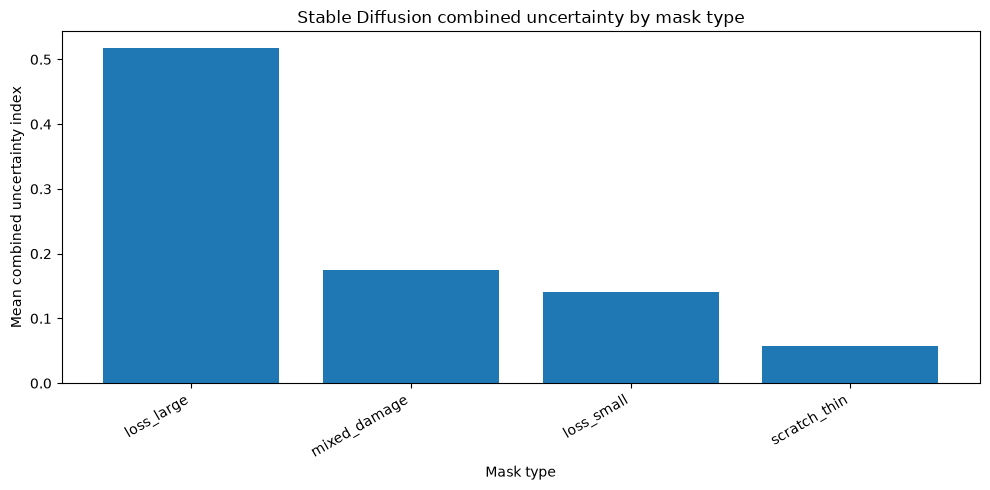

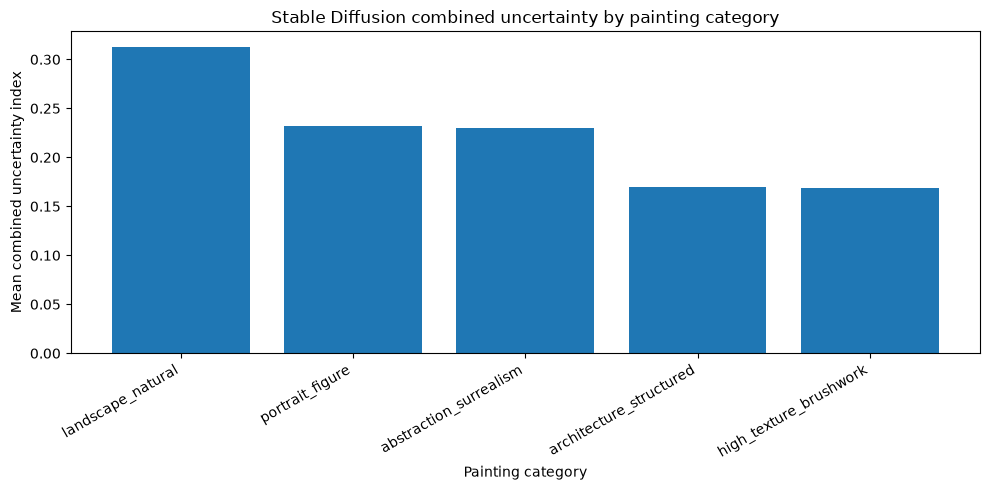

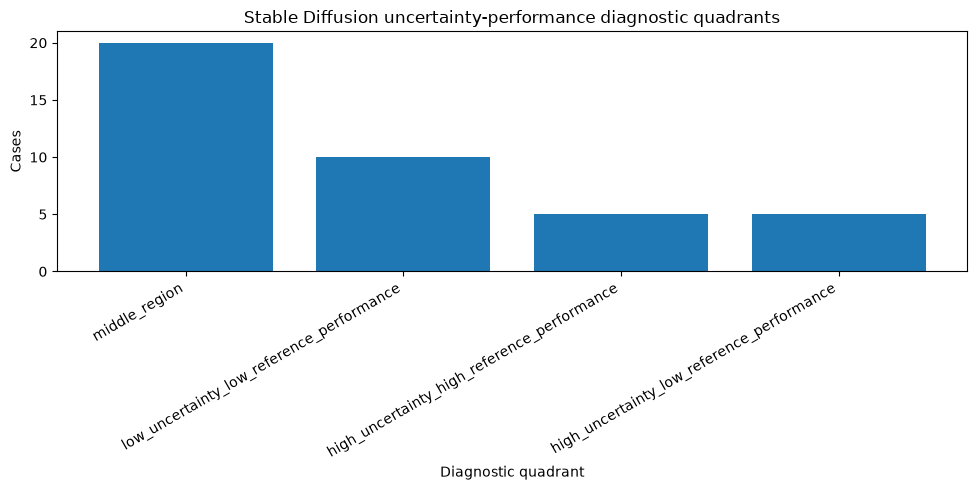

Saved final uncertainty mask chart: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\final_controlled_50_report\final_combined_uncertainty_by_mask_type.png
Saved final uncertainty category chart: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\final_controlled_50_report\final_combined_uncertainty_by_category.png
Saved final quadrant chart: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\final_controlled_50_report\final_uncertainty_performance_quadrants.png


In [26]:
final_uncertainty_mask_chart_path = final_report_figures_dir / "final_combined_uncertainty_by_mask_type.png"
final_uncertainty_category_chart_path = final_report_figures_dir / "final_combined_uncertainty_by_category.png"
final_quadrant_chart_path = final_report_figures_dir / "final_uncertainty_performance_quadrants.png"

save_bar_chart(
    uncertainty_combined_by_mask_type_df["mask_type"],
    uncertainty_combined_by_mask_type_df["mean_combined_uncertainty_index"],
    title="Stable Diffusion combined uncertainty by mask type",
    xlabel="Mask type",
    ylabel="Mean combined uncertainty index",
    output_path=final_uncertainty_mask_chart_path,
)

save_bar_chart(
    uncertainty_combined_by_category_df["category"],
    uncertainty_combined_by_category_df["mean_combined_uncertainty_index"],
    title="Stable Diffusion combined uncertainty by painting category",
    xlabel="Painting category",
    ylabel="Mean combined uncertainty index",
    output_path=final_uncertainty_category_chart_path,
)

save_bar_chart(
    uncertainty_quadrants_df["uncertainty_performance_quadrant"],
    uncertainty_quadrants_df["cases"],
    title="Stable Diffusion uncertainty-performance diagnostic quadrants",
    xlabel="Diagnostic quadrant",
    ylabel="Cases",
    output_path=final_quadrant_chart_path,
)

print("Saved final uncertainty mask chart:", final_uncertainty_mask_chart_path)
print("Saved final uncertainty category chart:", final_uncertainty_category_chart_path)
print("Saved final quadrant chart:", final_quadrant_chart_path)

In [27]:
final_summary_files = [
    final_output_paths["dataset_summary"],
    final_output_paths["model_stack_summary"],
    final_output_paths["metric_policy_summary"],
    final_output_paths["key_results_summary"],
    final_output_paths["model_win_summary"],
    final_output_paths["uncertainty_summary"],
    final_output_paths["sdxl_feasibility_summary"],
    per_metric_winner_summary_path,
    majority_vote_chart_path,
    metric_win_chart_path,
    mask_summary_chart_path,
    category_summary_chart_path,
    final_uncertainty_mask_chart_path,
    final_uncertainty_category_chart_path,
    final_quadrant_chart_path,
]

missing_final_summary_files = [
    str(path)
    for path in final_summary_files
    if not Path(path).exists()
]

if missing_final_summary_files:
    raise FileNotFoundError(
        "Missing final summary files:\n"
        + "\n".join(missing_final_summary_files)
    )

print("Final synthesis tables and charts passed validation.")
print("Saved final summary/chart files:", len(final_summary_files))

print("\nValidated files:")
for path in final_summary_files:
    print(path)

Final synthesis tables and charts passed validation.
Saved final summary/chart files: 15

Validated files:
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_dataset_summary.csv
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_model_stack_summary.csv
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_metric_policy_summary.csv
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_key_results_summary.csv
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_model_win_summary.csv
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_uncertainty_summary.csv
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_sdxl_feasibility_summary.csv
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_per_metric_winner_summary.csv
D:\Masters\FH\Thesis\painting-

## Final visual case selection

The final report should not rely only on tables.

This section builds a visual case manifest for the consolidated report. The selected cases cover:

- refined model-comparison examples,
- high metric-disagreement cases,
- Stable Diffusion uncertainty examples,
- trustworthiness diagnostic quadrant examples.

The visual cases are collected from earlier notebooks so that the final report can embed representative examples without regenerating model outputs.

In [28]:
print("Refined visual cases columns:")
print(refined_visual_cases_df.columns.tolist())

print("\nUncertainty visual cases columns:")
print(uncertainty_visual_cases_df.columns.tolist())

print("\nTrustworthiness visual cases columns:")
print(uncertainty_trustworthiness_visual_cases_df.columns.tolist())

print("\nRefined visual cases shape:", refined_visual_cases_df.shape)
print("Uncertainty visual cases shape:", uncertainty_visual_cases_df.shape)
print("Trustworthiness visual cases shape:", uncertainty_trustworthiness_visual_cases_df.shape)

Refined visual cases columns:
['case_id', 'painting_id', 'mask_id', 'mask_type', 'category', 'title', 'opencv_telea_mse_improvement', 'opencv_telea_psnr_improvement', 'opencv_telea_ssim_improvement', 'opencv_telea_lpips_improvement', 'opencv_telea_clip_improvement', 'opencv_telea_dinov2_improvement', 'lama_mse_improvement', 'lama_psnr_improvement', 'lama_ssim_improvement', 'lama_lpips_improvement', 'lama_clip_improvement', 'lama_dinov2_improvement', 'stable_diffusion_inpainting_mse_improvement', 'stable_diffusion_inpainting_psnr_improvement', 'stable_diffusion_inpainting_ssim_improvement', 'stable_diffusion_inpainting_lpips_improvement', 'stable_diffusion_inpainting_clip_improvement', 'stable_diffusion_inpainting_dinov2_improvement', 'winner_mse_improvement', 'winner_psnr_improvement', 'winner_ssim_improvement', 'winner_lpips_improvement', 'winner_clip_improvement', 'winner_dinov2_improvement', 'opencv_telea_metric_wins', 'lama_metric_wins', 'stable_diffusion_inpainting_metric_wins', '

In [29]:
def first_existing_column(df: pd.DataFrame, candidate_columns: list[str]) -> str | None:
    for column in candidate_columns:
        if column in df.columns:
            return column

    return None


def normalize_visual_case_table(
    df: pd.DataFrame,
    *,
    source_label: str,
    reason_column_candidates: list[str],
    figure_column_candidates: list[str],
) -> pd.DataFrame:
    reason_column = first_existing_column(df, reason_column_candidates)
    figure_column = first_existing_column(df, figure_column_candidates)

    normalized_df = df.copy()

    if reason_column is None:
        normalized_df["final_visual_reason"] = source_label
    else:
        normalized_df["final_visual_reason"] = normalized_df[reason_column].astype(str)

    if figure_column is None:
        normalized_df["final_figure_path"] = ""
    else:
        normalized_df["final_figure_path"] = normalized_df[figure_column].fillna("").astype(str)

    normalized_df["final_visual_source"] = source_label

    required_columns_with_defaults = {
        "original_case_id": "",
        "case_id": "",
        "category": "",
        "mask_type": "",
        "painting_id": "",
        "title": "",
    }

    for column, default_value in required_columns_with_defaults.items():
        if column not in normalized_df.columns:
            normalized_df[column] = default_value

    if "original_case_id" not in normalized_df.columns or normalized_df["original_case_id"].astype(str).eq("").all():
        if "case_id" in normalized_df.columns:
            normalized_df["original_case_id"] = normalized_df["case_id"].astype(str)

    final_columns = [
        "original_case_id",
        "case_id",
        "painting_id",
        "category",
        "mask_type",
        "title",
        "final_visual_source",
        "final_visual_reason",
        "final_figure_path",
    ]

    metric_context_columns = [
        "overall_metric_vote",
        "refined_overall_metric_vote",
        "combined_uncertainty_index",
        "masked_std_mean",
        "mean_pairwise_lpips",
        "mean_dinov2_uncertainty_distance",
        "refined_stable_diffusion_metric_wins",
        "uncertainty_performance_quadrant",
    ]

    for column in metric_context_columns:
        if column in normalized_df.columns:
            final_columns.append(column)

    final_columns = list(dict.fromkeys(final_columns))

    return normalized_df[final_columns].copy()


print("Visual case normalization helpers ready.")

Visual case normalization helpers ready.


In [30]:
refined_visual_normalized_df = normalize_visual_case_table(
    refined_visual_cases_df,
    source_label="refined_model_comparison",
    reason_column_candidates=[
        "refined_selection_reason",
        "visual_selection_reason",
        "selection_reason",
    ],
    figure_column_candidates=[
        "comparison_figure_path",
        "refined_comparison_figure_path",
        "figure_path",
    ],
)

uncertainty_visual_normalized_df = normalize_visual_case_table(
    uncertainty_visual_cases_df,
    source_label="stable_diffusion_uncertainty",
    reason_column_candidates=[
        "visual_selection_reason",
        "uncertainty_visual_reason",
        "selection_reason",
    ],
    figure_column_candidates=[
        "uncertainty_grid_figure_path",
        "figure_path",
    ],
)

trustworthiness_visual_normalized_df = normalize_visual_case_table(
    uncertainty_trustworthiness_visual_cases_df,
    source_label="uncertainty_trustworthiness_quadrant",
    reason_column_candidates=[
        "trustworthiness_visual_reason",
        "uncertainty_performance_quadrant",
        "visual_selection_reason",
    ],
    figure_column_candidates=[
        "trustworthiness_grid_figure_path",
        "uncertainty_grid_figure_path",
        "figure_path",
    ],
)

final_visual_cases_df = pd.concat(
    [
        refined_visual_normalized_df,
        uncertainty_visual_normalized_df,
        trustworthiness_visual_normalized_df,
    ],
    ignore_index=True,
)

final_visual_cases_df["final_figure_exists"] = final_visual_cases_df["final_figure_path"].apply(
    lambda path_value: bool(str(path_value).strip()) and resolve_project_path(path_value).exists()
)

final_visual_cases_df = final_visual_cases_df.sort_values(
    [
        "final_visual_source",
        "final_visual_reason",
        "category",
        "mask_type",
        "original_case_id",
    ]
).reset_index(drop=True)

final_visual_cases_df.to_csv(final_output_paths["final_visual_cases"], index=False)

print("Saved final visual case manifest:", final_output_paths["final_visual_cases"])
print("Final visual rows:", len(final_visual_cases_df))
print("Rows with existing figures:", int(final_visual_cases_df["final_figure_exists"].sum()))
print("Rows missing figures:", int((~final_visual_cases_df["final_figure_exists"]).sum()))

display(
    final_visual_cases_df[
        [
            "original_case_id",
            "category",
            "mask_type",
            "final_visual_source",
            "final_visual_reason",
            "final_figure_exists",
            "final_figure_path",
        ]
    ].head(30)
)

if final_visual_cases_df["final_figure_exists"].sum() == 0:
    raise FileNotFoundError("No final visual figures were found.")

Saved final visual case manifest: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_visual_cases.csv
Final visual rows: 110
Rows with existing figures: 65
Rows missing figures: 45


,original_case_id,category,mask_type,final_visual_source,final_visual_reason,final_figure_exists,final_figure_path
0,p039_scratch_thin,abstraction_surrealism,scratch_thin,refined_model_comparison,old_vs_refined_vote_changed,False,
1,p026_loss_small,architecture_structured,loss_small,refined_model_comparison,old_vs_refined_vote_changed,False,
2,p027_loss_small,architecture_structured,loss_small,refined_model_comparison,old_vs_refined_vote_changed,False,
3,p030_loss_small,architecture_structured,loss_small,refined_model_comparison,old_vs_refined_vote_changed,False,
4,p041_loss_large,high_texture_brushwork,loss_large,refined_model_comparison,old_vs_refined_vote_changed,False,
5,p041_loss_small,high_texture_brushwork,loss_small,refined_model_comparison,old_vs_refined_vote_changed,False,
6,p049_loss_small,high_texture_brushwork,loss_small,refined_model_comparison,old_vs_refined_vote_changed,False,
7,p050_loss_small,high_texture_brushwork,loss_small,refined_model_comparison,old_vs_refined_vote_changed,False,
8,p041_mixed_damage,high_texture_brushwork,mixed_damage,refined_model_comparison,old_vs_refined_vote_changed,False,
9,p050_mixed_damage,high_texture_brushwork,mixed_damage,refined_model_comparison,old_vs_refined_vote_changed,False,


In [31]:
final_visual_summary_df = (
    final_visual_cases_df
    .groupby(["final_visual_source", "final_visual_reason"], dropna=False)
    .agg(
        rows=("original_case_id", "count"),
        unique_cases=("original_case_id", "nunique"),
        figures_available=("final_figure_exists", "sum"),
    )
    .reset_index()
    .sort_values(["final_visual_source", "final_visual_reason"])
)

final_visual_summary_path = (
    final_report_metrics_dir / "final_controlled_50_visual_case_summary.csv"
)

final_visual_summary_df.to_csv(final_visual_summary_path, index=False)

print("Saved final visual case summary:", final_visual_summary_path)
display(final_visual_summary_df)

Saved final visual case summary: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\final_controlled_50_visual_case_summary.csv


,final_visual_source,final_visual_reason,rows,unique_cases,figures_available
0,refined_model_comparison,old_vs_refined_vote_changed,22,22,1
1,refined_model_comparison,old_vs_refined_vote_changed; refined_metric_di...,2,2,2
2,refined_model_comparison,refined_category_mask_representative,18,18,1
3,refined_model_comparison,refined_category_mask_representative; refined_...,1,1,1
4,refined_model_comparison,refined_category_mask_representative; refined_...,1,1,1
5,refined_model_comparison,refined_majority_vote_lama,4,4,2
6,refined_model_comparison,refined_majority_vote_opencv_telea,4,4,4
7,refined_model_comparison,refined_majority_vote_stable_diffusion_inpaint...,1,1,1
8,refined_model_comparison,refined_metric_disagreement,9,9,4
9,stable_diffusion_uncertainty,category_mask_representative_highest,20,20,20


In [32]:
available_final_visual_cases_df = final_visual_cases_df[
    final_visual_cases_df["final_figure_exists"]
].copy()

refined_gallery_df = available_final_visual_cases_df[
    available_final_visual_cases_df["final_visual_source"] == "refined_model_comparison"
].copy()

uncertainty_gallery_df = available_final_visual_cases_df[
    available_final_visual_cases_df["final_visual_source"] == "stable_diffusion_uncertainty"
].copy()

trustworthiness_gallery_df = available_final_visual_cases_df[
    available_final_visual_cases_df["final_visual_source"] == "uncertainty_trustworthiness_quadrant"
].copy()

# Keep galleries large enough for the final report but not absurdly massive.
refined_gallery_df = refined_gallery_df.head(12).copy()

uncertainty_gallery_df = (
    uncertainty_gallery_df
    .sort_values(
        ["final_visual_reason", "masked_std_mean"] if "masked_std_mean" in uncertainty_gallery_df.columns else ["final_visual_reason"],
        ascending=[True, False] if "masked_std_mean" in uncertainty_gallery_df.columns else [True],
    )
    .head(12)
    .copy()
)

trustworthiness_gallery_df = (
    trustworthiness_gallery_df
    .sort_values(
        ["final_visual_reason", "combined_uncertainty_index"] if "combined_uncertainty_index" in trustworthiness_gallery_df.columns else ["final_visual_reason"],
        ascending=[True, False] if "combined_uncertainty_index" in trustworthiness_gallery_df.columns else [True],
    )
    .head(16)
    .copy()
)

print("Refined report gallery rows:", len(refined_gallery_df))
print("Uncertainty report gallery rows:", len(uncertainty_gallery_df))
print("Trustworthiness report gallery rows:", len(trustworthiness_gallery_df))

display(
    refined_gallery_df[
        [
            "original_case_id",
            "category",
            "mask_type",
            "final_visual_reason",
            "final_figure_path",
        ]
    ].head()
)

display(
    uncertainty_gallery_df[
        [
            "original_case_id",
            "category",
            "mask_type",
            "final_visual_reason",
            "final_figure_path",
        ]
    ].head()
)

display(
    trustworthiness_gallery_df[
        [
            "original_case_id",
            "category",
            "mask_type",
            "final_visual_reason",
            "final_figure_path",
        ]
    ].head()
)

Refined report gallery rows: 12
Uncertainty report gallery rows: 12
Trustworthiness report gallery rows: 12


,original_case_id,category,mask_type,final_visual_reason,final_figure_path
20,p004_scratch_thin,portrait_figure,scratch_thin,old_vs_refined_vote_changed,D:\Masters\FH\Thesis\painting-restoration-eval...
22,p040_loss_large,abstraction_surrealism,loss_large,old_vs_refined_vote_changed; refined_metric_di...,D:\Masters\FH\Thesis\painting-restoration-eval...
23,p001_mixed_damage,portrait_figure,mixed_damage,old_vs_refined_vote_changed; refined_metric_di...,D:\Masters\FH\Thesis\painting-restoration-eval...
27,p030_loss_large,architecture_structured,loss_large,refined_category_mask_representative,D:\Masters\FH\Thesis\painting-restoration-eval...
42,p001_loss_large,portrait_figure,loss_large,refined_category_mask_representative; refined_...,D:\Masters\FH\Thesis\painting-restoration-eval...


,original_case_id,category,mask_type,final_visual_reason,final_figure_path
74,p011_loss_large,landscape_natural,loss_large,category_mask_representative_highest,outputs/figures/uncertainty/stable_diffusion_i...
78,p009_loss_large,portrait_figure,loss_large,category_mask_representative_highest,outputs/figures/uncertainty/stable_diffusion_i...
62,p031_loss_large,abstraction_surrealism,loss_large,category_mask_representative_highest,outputs/figures/uncertainty/stable_diffusion_i...
76,p011_mixed_damage,landscape_natural,mixed_damage,category_mask_representative_highest,outputs/figures/uncertainty/stable_diffusion_i...
63,p037_loss_small,abstraction_surrealism,loss_small,category_mask_representative_highest,outputs/figures/uncertainty/stable_diffusion_i...


,original_case_id,category,mask_type,final_visual_reason,final_figure_path
101,p009_loss_large,portrait_figure,loss_large,high_uncertainty_high_reference_performance,outputs/figures/uncertainty/stable_diffusion_i...
100,p018_loss_large,landscape_natural,loss_large,high_uncertainty_high_reference_performance,outputs/figures/uncertainty/stable_diffusion_i...
98,p037_loss_large,abstraction_surrealism,loss_large,high_uncertainty_high_reference_performance,outputs/figures/uncertainty/stable_diffusion_i...
99,p043_loss_large,high_texture_brushwork,loss_large,high_uncertainty_high_reference_performance,outputs/figures/uncertainty/stable_diffusion_i...
104,p011_loss_large,landscape_natural,loss_large,high_uncertainty_low_reference_performance,outputs/figures/uncertainty/stable_diffusion_i...


In [33]:
def render_visual_gallery(
    gallery_df: pd.DataFrame,
    *,
    title: str,
    intro: str,
    max_items: int = 12,
) -> str:
    if gallery_df.empty:
        return f"""
        <section class="report-section">
            <h2>{title}</h2>
            <p>{intro}</p>
            <p>No visual examples available.</p>
        </section>
        """

    gallery_items = []

    for _, row in gallery_df.head(max_items).iterrows():
        case_id = row.get("original_case_id", "")
        category = row.get("category", "")
        mask_type = row.get("mask_type", "")
        reason = row.get("final_visual_reason", "")
        source = row.get("final_visual_source", "")
        figure_path = row.get("final_figure_path", "")

        extra_parts = []

        if "combined_uncertainty_index" in row and pd.notna(row["combined_uncertainty_index"]):
            extra_parts.append(f"uncertainty={float(row['combined_uncertainty_index']):.4f}")

        if "masked_std_mean" in row and pd.notna(row["masked_std_mean"]):
            extra_parts.append(f"masked std={float(row['masked_std_mean']):.4f}")

        if "refined_stable_diffusion_metric_wins" in row and pd.notna(row["refined_stable_diffusion_metric_wins"]):
            extra_parts.append(f"SD metric wins={row['refined_stable_diffusion_metric_wins']}")

        caption = " | ".join(
            [
                f"<strong>{case_id}</strong>",
                str(category),
                str(mask_type),
                str(source),
                str(reason),
                *extra_parts,
            ]
        )

        gallery_items.append(
            f"""
            <div class="gallery-item">
                {render_embedded_image(figure_path, alt_text=str(case_id), css_class="gallery-image")}
                <p class="caption">{caption}</p>
            </div>
            """
        )

    return f"""
    <section class="report-section">
        <h2>{title}</h2>
        <p>{intro}</p>
        <div class="gallery-grid">
            {''.join(gallery_items)}
        </div>
    </section>
    """


print("Visual gallery renderer ready.")

Visual gallery renderer ready.


refined_model_comparison | p004_scratch_thin | portrait_figure | scratch_thin


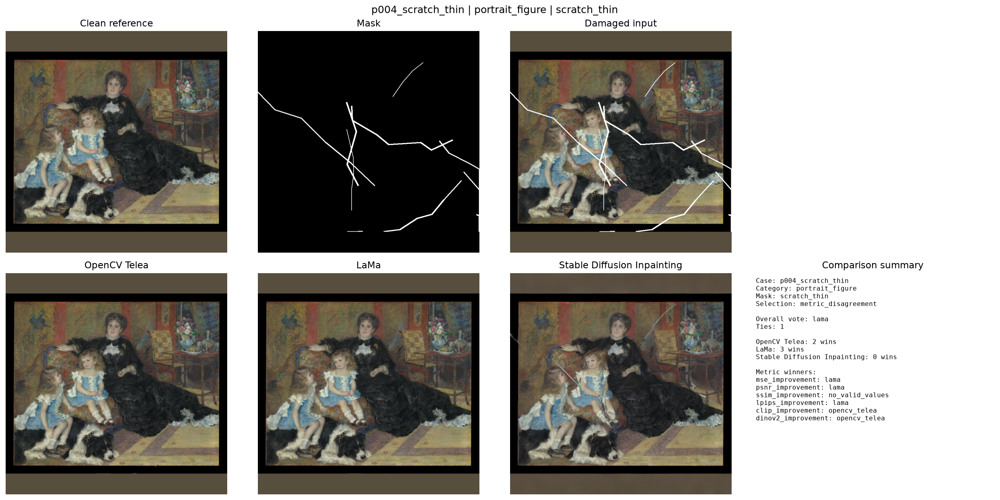

stable_diffusion_uncertainty | p011_loss_large | landscape_natural | loss_large


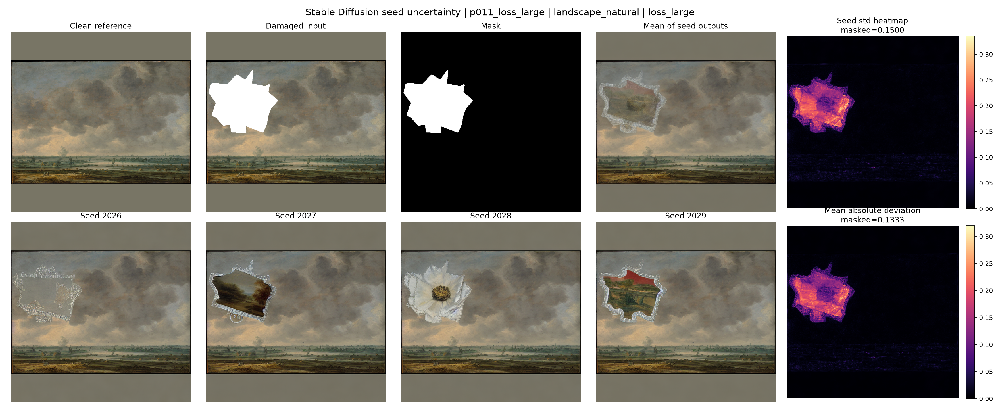

uncertainty_trustworthiness_quadrant | p009_loss_large | portrait_figure | loss_large


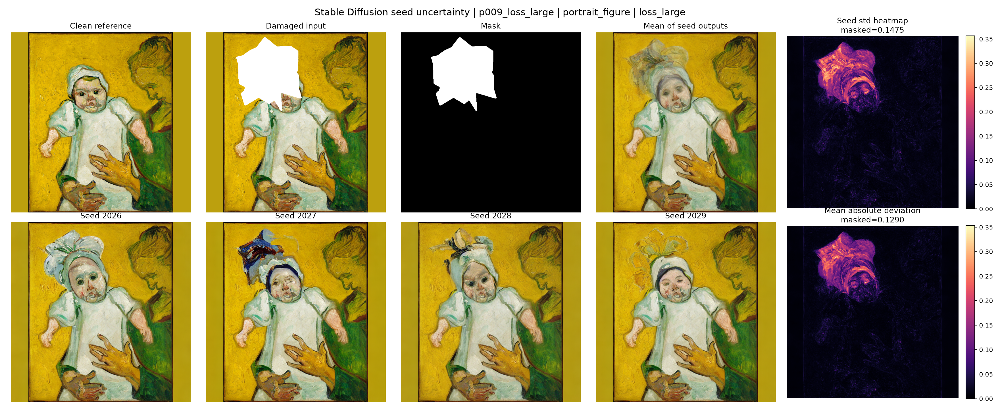

In [34]:
sample_gallery_df = pd.concat(
    [
        refined_gallery_df.head(1),
        uncertainty_gallery_df.head(1),
        trustworthiness_gallery_df.head(1),
    ],
    ignore_index=True,
)

for _, row in sample_gallery_df.iterrows():
    print(
        f"{row['final_visual_source']} | {row['original_case_id']} | "
        f"{row['category']} | {row['mask_type']}"
    )

    figure_path = resolve_project_path(row["final_figure_path"])
    display(Image.open(figure_path))

## Final controlled evaluation report assembly

This section creates the final consolidated HTML report for the controlled 50-painting evaluation.

The report brings together:

- dataset and damage design,
- evaluated restoration models,
- SDXL feasibility decision,
- refined metric-region policy,
- final model comparison,
- Stable Diffusion uncertainty analysis,
- uncertainty-performance linkage,
- visual comparison examples,
- final thesis interpretation.

The report is intended to be the main experimental summary artifact for the controlled 50-painting evaluation.

In [35]:
def render_metric_card(label: str, value, description: str = "") -> str:
    return f"""
    <div class="metric-card">
        <div class="metric-label">{label}</div>
        <div class="metric-value">{value}</div>
        <div class="metric-description">{description}</div>
    </div>
    """


def render_chart_block(title: str, path_value: str | Path, caption: str) -> str:
    return f"""
    <div class="chart-block">
        <h3>{title}</h3>
        {render_embedded_image(path_value, alt_text=title, css_class="chart-image")}
        <p class="caption">{caption}</p>
    </div>
    """


total_paintings = len(processed_metadata_df)
total_damage_cases = len(damage_metadata_df)
total_non_zero_cases = len(refined_comparison_df)
total_models_fully_evaluated = 3
total_uncertainty_outputs = len(uncertainty_generations_df)

lama_majority_cases = int((refined_comparison_df["overall_metric_vote"] == "lama").sum())
opencv_majority_cases = int((refined_comparison_df["overall_metric_vote"] == "opencv_telea").sum())
sd_majority_cases = int(
    (refined_comparison_df["overall_metric_vote"] == "stable_diffusion_inpainting").sum()
)

top_uncertainty_case = uncertainty_combined_by_case_df.sort_values(
    "combined_uncertainty_index",
    ascending=False,
).iloc[0]

overview_cards_html = "\n".join(
    [
        render_metric_card(
            "Paintings",
            total_paintings,
            "Controlled benchmark subset",
        ),
        render_metric_card(
            "Damage cases",
            total_damage_cases,
            "50 paintings × 5 mask types",
        ),
        render_metric_card(
            "Non-zero comparisons",
            total_non_zero_cases,
            "Local restoration comparison cases",
        ),
        render_metric_card(
            "Fully evaluated models",
            total_models_fully_evaluated,
            "OpenCV Telea, LaMa, Stable Diffusion",
        ),
        render_metric_card(
            "LaMa majority wins",
            f"{lama_majority_cases}/{total_non_zero_cases}",
            "Refined local metric majority vote",
        ),
        render_metric_card(
            "OpenCV majority wins",
            f"{opencv_majority_cases}/{total_non_zero_cases}",
            "Refined local metric majority vote",
        ),
        render_metric_card(
            "Stable Diffusion majority wins",
            f"{sd_majority_cases}/{total_non_zero_cases}",
            "Refined local metric majority vote",
        ),
        render_metric_card(
            "Uncertainty outputs",
            total_uncertainty_outputs,
            "40 cases × 4 seeds",
        ),
        render_metric_card(
            "Highest uncertainty case",
            top_uncertainty_case["original_case_id"],
            (
                f"{top_uncertainty_case['mask_type']} | "
                f"index {top_uncertainty_case['combined_uncertainty_index']:.3f}"
            ),
        ),
    ]
)

print("Overview cards prepared.")

Overview cards prepared.


In [36]:
final_chart_blocks_html = "\n".join(
    [
        render_chart_block(
            "Refined majority-vote cases by model",
            majority_vote_chart_path,
            "Number of non-zero damaged cases won by each model under the refined local metric policy.",
        ),
        render_chart_block(
            "Total refined metric wins by model",
            metric_win_chart_path,
            "Total metric-level wins across MSE, PSNR, SSIM, LPIPS, CLIP, and DINOv2.",
        ),
        render_chart_block(
            "Mean refined metric wins by mask type",
            mask_summary_chart_path,
            "Average model metric wins per case grouped by synthetic damage type.",
        ),
        render_chart_block(
            "Mean refined metric wins by painting category",
            category_summary_chart_path,
            "Average model metric wins per case grouped by painting category.",
        ),
        render_chart_block(
            "Stable Diffusion combined uncertainty by mask type",
            final_uncertainty_mask_chart_path,
            "Mean combined multi-seed uncertainty index by damage type.",
        ),
        render_chart_block(
            "Stable Diffusion combined uncertainty by painting category",
            final_uncertainty_category_chart_path,
            "Mean combined multi-seed uncertainty index by painting category.",
        ),
        render_chart_block(
            "Stable Diffusion uncertainty-performance quadrants",
            final_quadrant_chart_path,
            "Diagnostic grouping of uncertainty and reference-based Stable Diffusion performance.",
        ),
    ]
)

print("Final report chart blocks prepared.")

Final report chart blocks prepared.


In [37]:
dataset_design_table_df = pd.DataFrame(
    [
        {
            "component": "paintings",
            "value": "50",
            "description": "Controlled subset of painting images.",
        },
        {
            "component": "categories",
            "value": "5",
            "description": "portrait_figure, landscape_natural, architecture_structured, abstraction_surrealism, high_texture_brushwork.",
        },
        {
            "component": "paintings_per_category",
            "value": "10",
            "description": "Balanced category design.",
        },
        {
            "component": "mask_types",
            "value": "5",
            "description": "zero_control, scratch_thin, loss_small, loss_large, mixed_damage.",
        },
        {
            "component": "total_damage_cases",
            "value": "250",
            "description": "50 paintings × 5 mask types.",
        },
        {
            "component": "non_zero_local_comparison_cases",
            "value": "200",
            "description": "Four non-zero damage masks per painting.",
        },
    ]
)

final_model_comparison_table_df = model_win_summary_df[
    [
        "display_name",
        "total_metric_wins",
        "majority_vote_cases",
        "majority_vote_rate",
        "mean_metric_wins_per_case",
    ]
].copy()

final_uncertainty_table_df = uncertainty_summary_df.copy()

top_uncertainty_table_df = uncertainty_combined_by_case_df[
    [
        "uncertainty_rank_high_to_low",
        "original_case_id",
        "category",
        "mask_type",
        "combined_uncertainty_index",
        "masked_std_mean",
        "mean_pairwise_lpips",
        "mean_dinov2_uncertainty_distance",
    ]
].head(10)

uncertainty_performance_table_df = uncertainty_vs_refined_df[
    [
        "original_case_id",
        "category",
        "mask_type",
        "combined_uncertainty_index",
        "refined_stable_diffusion_metric_wins",
        "refined_overall_metric_vote",
        "uncertainty_performance_quadrant",
    ]
].sort_values("combined_uncertainty_index", ascending=False).head(12)

print("Final report table snippets prepared.")

Final report table snippets prepared.


In [38]:
report_generated_at = datetime.now().strftime("%Y-%m-%d %H:%M:%S")

refined_gallery_html = render_visual_gallery(
    refined_gallery_df,
    title="10. Refined model-comparison visual examples",
    intro=(
        "These examples come from the refined three-model comparison and show representative "
        "cases, metric disagreement cases, and model-comparison visual grids."
    ),
    max_items=12,
)

uncertainty_gallery_html = render_visual_gallery(
    uncertainty_gallery_df,
    title="11. Stable Diffusion uncertainty visual examples",
    intro=(
        "These examples show multi-seed Stable Diffusion uncertainty grids. Each grid compares "
        "the clean reference, damaged input, mask, seed outputs, and uncertainty heatmaps."
    ),
    max_items=12,
)

trustworthiness_gallery_html = render_visual_gallery(
    trustworthiness_gallery_df,
    title="12. Trustworthiness diagnostic visual examples",
    intro=(
        "These examples link Stable Diffusion uncertainty to reference-based performance. "
        "They illustrate cases such as high uncertainty with weak metric performance, or low uncertainty "
        "with stronger reference-based behavior."
    ),
    max_items=16,
)

final_report_html = f"""
<!DOCTYPE html>
<html lang="en">
<head>
<meta charset="utf-8">
<title>Final Controlled 50-Painting Evaluation Report</title>
<style>
    body {{
        font-family: Arial, Helvetica, sans-serif;
        margin: 0;
        padding: 0;
        background: #f3f3f3;
        color: #222;
        line-height: 1.55;
    }}

    .page {{
        max-width: 1380px;
        margin: 0 auto;
        background: #fff;
        padding: 38px 48px 70px 48px;
    }}

    h1 {{
        font-size: 36px;
        margin-bottom: 8px;
    }}

    h2 {{
        font-size: 26px;
        margin-top: 44px;
        padding-bottom: 8px;
        border-bottom: 2px solid #ddd;
    }}

    h3 {{
        font-size: 20px;
        margin-top: 28px;
    }}

    .subtitle {{
        font-size: 17px;
        color: #555;
        margin-bottom: 22px;
    }}

    .timestamp {{
        color: #666;
        font-size: 13px;
        margin-bottom: 28px;
    }}

    .metric-grid {{
        display: grid;
        grid-template-columns: repeat(3, minmax(220px, 1fr));
        gap: 16px;
        margin: 24px 0 32px 0;
    }}

    .metric-card {{
        background: #fafafa;
        border: 1px solid #ddd;
        border-radius: 12px;
        padding: 16px;
    }}

    .metric-label {{
        font-size: 12px;
        color: #666;
        text-transform: uppercase;
        letter-spacing: 0.05em;
    }}

    .metric-value {{
        font-size: 27px;
        font-weight: bold;
        margin: 8px 0;
    }}

    .metric-description {{
        font-size: 13px;
        color: #555;
    }}

    .report-section {{
        margin-top: 38px;
    }}

    .interpretation-box {{
        background: #f7f7f7;
        border-left: 5px solid #333;
        padding: 18px 22px;
        margin: 22px 0;
    }}

    .warning-box {{
        background: #fff7e6;
        border-left: 5px solid #a36b00;
        padding: 18px 22px;
        margin: 22px 0;
    }}

    .data-table {{
        border-collapse: collapse;
        width: 100%;
        margin: 18px 0 30px 0;
        font-size: 13px;
    }}

    .data-table th {{
        background: #333;
        color: white;
        text-align: left;
        padding: 8px;
    }}

    .data-table td {{
        border-bottom: 1px solid #ddd;
        padding: 7px 8px;
        vertical-align: top;
    }}

    .data-table tr:nth-child(even) {{
        background: #f8f8f8;
    }}

    .chart-block {{
        margin: 30px 0 42px 0;
        padding: 18px;
        border: 1px solid #ddd;
        border-radius: 12px;
        background: #fcfcfc;
    }}

    .chart-image {{
        max-width: 100%;
        display: block;
        margin: 12px auto;
        border: 1px solid #ddd;
        border-radius: 8px;
    }}

    .gallery-grid {{
        display: grid;
        grid-template-columns: 1fr;
        gap: 30px;
        margin-top: 20px;
    }}

    .gallery-item {{
        border: 1px solid #ddd;
        border-radius: 12px;
        background: #fcfcfc;
        padding: 18px;
    }}

    .gallery-image {{
        width: 100%;
        display: block;
        border: 1px solid #ddd;
        border-radius: 8px;
    }}

    .caption {{
        color: #555;
        font-size: 13px;
        margin-top: 10px;
    }}

    .missing-image {{
        color: #a00000;
        font-weight: bold;
    }}

    code {{
        background: #eee;
        padding: 2px 5px;
        border-radius: 4px;
    }}

    ul {{
        margin-top: 8px;
    }}

    .small-note {{
        font-size: 13px;
        color: #666;
    }}
</style>
</head>

<body>
<div class="page">

<h1>Final Controlled 50-Painting Evaluation Report</h1>
<div class="subtitle">
    Trustworthy evaluation framework for AI-assisted painting restoration.
</div>
<div class="timestamp">
    Generated at: {report_generated_at}
</div>

<section class="report-section">
    <h2>1. Executive summary</h2>

    <p>
        This report consolidates the controlled 50-painting evaluation of AI-assisted painting restoration methods.
        It combines dataset design, synthetic damage generation, three fully evaluated restoration models,
        SDXL feasibility analysis, refined metric-region comparison, and Stable Diffusion uncertainty analysis.
    </p>

    <div class="interpretation-box">
        <strong>Main thesis claim:</strong>
        Visual plausibility is not the same as restoration trustworthiness.
        A restoration can appear coherent while being less reference-faithful, unstable across seeds,
        or sensitive to damage type and painting category.
    </div>

    <div class="metric-grid">
        {overview_cards_html}
    </div>
</section>

<section class="report-section">
    <h2>2. Dataset and synthetic damage design</h2>

    <p>
        The evaluation uses a controlled benchmark of 50 paintings across five painting categories.
        Each painting was paired with five synthetic mask types, giving 250 total cases.
        The zero-control mask is retained for completeness, while the four non-zero masks are used
        for local restoration comparison.
    </p>

    {dataframe_to_html_table(dataset_design_table_df, float_precision=4)}

    <h3>Dataset summary</h3>
    {dataframe_to_html_table(dataset_summary_df, float_precision=4)}
</section>

<section class="report-section">
    <h2>3. Evaluated model stack</h2>

    <p>
        Three models were fully evaluated locally: OpenCV Telea, LaMa, and Stable Diffusion Inpainting.
        SDXL Inpainting was audited for feasibility but excluded from the full controlled local evaluation
        because the available 6GB GPU was not sufficient for practical full-scale inference.
    </p>

    {dataframe_to_html_table(model_stack_summary_df, float_precision=4)}

    <h3>SDXL feasibility summary</h3>
    {dataframe_to_html_table(sdxl_feasibility_summary_df, float_precision=4)}

    <div class="warning-box">
        <strong>SDXL interpretation:</strong>
        SDXL was excluded because of local computational feasibility constraints.
        This is not a full model-quality conclusion. A future remote GPU experiment could revisit SDXL.
    </div>
</section>

<section class="report-section">
    <h2>4. Refined metric-region policy</h2>

    <p>
        The final comparison uses a refined local metric-region policy.
        Sparse masked-region SSIM was found to be invalid for local comparison because SSIM requires
        image-like local structure. SSIM was retained, but moved to the mask-bounding-box crop.
    </p>

    {dataframe_to_html_table(metric_policy_summary_df, float_precision=4)}

    <div class="interpretation-box">
        <strong>Methodological point:</strong>
        Metrics must be evaluated on regions that match their assumptions.
        Pixel-error metrics can operate on sparse damaged pixels, but structural, perceptual,
        and feature metrics require image-like local crops.
    </div>
</section>

<section class="report-section">
    <h2>5. Final refined model comparison</h2>

    <p>
        The final three-model comparison is based on 200 non-zero damaged cases and six local metric signals:
        MSE, PSNR, SSIM, LPIPS, CLIP, and DINOv2. The refined policy is used for all final model-comparison
        interpretations.
    </p>

    <h3>Model win summary</h3>
    {dataframe_to_html_table(final_model_comparison_table_df, float_precision=5)}

    <h3>Per-metric winner summary</h3>
    {dataframe_to_html_table(per_metric_winner_summary_df, max_rows=40, float_precision=5)}

    <h3>Summary by mask type</h3>
    {dataframe_to_html_table(refined_summary_by_mask_type_df, float_precision=5)}

    <h3>Summary by painting category</h3>
    {dataframe_to_html_table(refined_summary_by_category_df, float_precision=5)}

    <div class="interpretation-box">
        <strong>Main model-comparison finding:</strong>
        LaMa dominates the refined reference-based metric comparison. Stable Diffusion Inpainting can produce
        visually plausible completions, but these completions rarely win the refined local reference-based
        majority vote.
    </div>
</section>

<section class="report-section">
    <h2>6. Stable Diffusion uncertainty analysis</h2>

    <p>
        The uncertainty analysis evaluates whether Stable Diffusion Inpainting produces stable restorations
        across multiple random seeds. A balanced diagnostic subset of 40 cases was generated with four seeds
        each, producing 160 outputs.
    </p>

    <h3>Uncertainty summary</h3>
    {dataframe_to_html_table(final_uncertainty_table_df, float_precision=5)}

    <h3>Combined uncertainty by mask type</h3>
    {dataframe_to_html_table(uncertainty_combined_by_mask_type_df, float_precision=5)}

    <h3>Combined uncertainty by category</h3>
    {dataframe_to_html_table(uncertainty_combined_by_category_df, float_precision=5)}

    <h3>Top uncertainty cases</h3>
    {dataframe_to_html_table(top_uncertainty_table_df, float_precision=5)}

    <div class="interpretation-box">
        <strong>Uncertainty finding:</strong>
        Multi-seed analysis reveals whether Stable Diffusion is producing a stable restoration estimate
        or sampling multiple plausible completions. High uncertainty is a trustworthiness warning,
        especially when paired with weak reference-based performance.
    </div>
</section>

<section class="report-section">
    <h2>7. Uncertainty versus reference-based performance</h2>

    <p>
        The uncertainty analysis is linked back to the refined model comparison. This allows the report
        to distinguish between reference-based accuracy and stochastic stability.
    </p>

    <h3>Uncertainty-performance quadrants</h3>
    {dataframe_to_html_table(uncertainty_quadrants_df, float_precision=5)}

    <h3>High-uncertainty cases linked to refined comparison</h3>
    {dataframe_to_html_table(uncertainty_performance_table_df, float_precision=5)}

    <div class="interpretation-box">
        <strong>Trustworthiness interpretation:</strong>
        A model can be unreliable because it is wrong against the reference, unstable across seeds,
        or both. The uncertainty-performance quadrant analysis separates these failure modes.
    </div>
</section>

<section class="report-section">
    <h2>8. Final key findings</h2>

    {dataframe_to_html_table(key_results_summary_df, float_precision=4)}
</section>

<section class="report-section">
    <h2>9. Final charts</h2>
    {final_chart_blocks_html}
</section>

{refined_gallery_html}

{uncertainty_gallery_html}

{trustworthiness_gallery_html}

<section class="report-section">
    <h2>13. Final thesis interpretation</h2>

    <p>
        The controlled evaluation supports a layered view of restoration trustworthiness.
        Standard image metrics are useful, but they are not sufficient alone. The final framework
        combines reference-based comparison, metric-region policy, visual inspection, model audit,
        and multi-seed uncertainty analysis.
    </p>

    <p>
        LaMa performs best under the refined reference-based metric comparison. OpenCV Telea remains
        a useful deterministic classical baseline. Stable Diffusion Inpainting demonstrates the central
        tension of generative restoration: it can create plausible completions, but those completions may
        be less reference-faithful and may vary across seeds.
    </p>

    <p>
        The uncertainty analysis is therefore not an optional extra. It is a core trustworthiness diagnostic
        for diffusion-based restoration. If repeated generations for the same damaged region produce different
        results, then a single output should not be treated as a stable restoration estimate.
    </p>

    <div class="interpretation-box">
        <strong>Final conclusion:</strong>
        AI-assisted painting restoration should be evaluated not only by apparent visual quality or reference
        similarity, but also by whether the model behaves consistently and transparently under controlled
        damage conditions. Visual plausibility alone is not enough.
    </div>

    <p class="small-note">
        Generated from notebook:
        <code>28_final_controlled_50_evaluation_report_cleaned.ipynb</code>
    </p>
</section>

</div>
</body>
</html>
"""

final_report_path.write_text(final_report_html, encoding="utf-8")

print("Saved final controlled evaluation report:", final_report_path)
print("Report characters:", len(final_report_html))
print("Embedded image count:", final_report_html.count("data:image/"))

Saved final controlled evaluation report: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\final_controlled_50_evaluation_report.html
Report characters: 202325257
Embedded image count: 43


In [39]:
if not final_report_path.exists():
    raise FileNotFoundError(f"Missing final report: {final_report_path}")

final_html_content = final_report_path.read_text(encoding="utf-8")

required_final_report_phrases = [
    "Final Controlled 50-Painting Evaluation Report",
    "Visual plausibility is not the same as restoration trustworthiness",
    "Dataset and synthetic damage design",
    "Evaluated model stack",
    "Refined metric-region policy",
    "Final refined model comparison",
    "Stable Diffusion uncertainty analysis",
    "Uncertainty versus reference-based performance",
    "Final thesis interpretation",
    "AI-assisted painting restoration should be evaluated",
]

missing_final_report_phrases = [
    phrase for phrase in required_final_report_phrases
    if phrase not in final_html_content
]

if missing_final_report_phrases:
    raise ValueError(
        "Final report missing expected phrases:\n"
        + "\n".join(missing_final_report_phrases)
    )

if len(final_html_content) < 60_000:
    raise ValueError(
        f"Final report seems too small: {len(final_html_content)} characters."
    )

embedded_image_count = final_html_content.count("data:image/")

if embedded_image_count < 10:
    raise ValueError(
        f"Expected at least 10 embedded images in final report, found {embedded_image_count}."
    )

expected_final_report_artifacts = [
    final_report_path,
    final_output_paths["dataset_summary"],
    final_output_paths["model_stack_summary"],
    final_output_paths["metric_policy_summary"],
    final_output_paths["key_results_summary"],
    final_output_paths["model_win_summary"],
    final_output_paths["uncertainty_summary"],
    final_output_paths["sdxl_feasibility_summary"],
    final_output_paths["final_visual_cases"],
    final_visual_summary_path,
    per_metric_winner_summary_path,
    majority_vote_chart_path,
    metric_win_chart_path,
    mask_summary_chart_path,
    category_summary_chart_path,
    final_uncertainty_mask_chart_path,
    final_uncertainty_category_chart_path,
    final_quadrant_chart_path,
]

missing_final_report_artifacts = [
    str(path)
    for path in expected_final_report_artifacts
    if not Path(path).exists()
]

if missing_final_report_artifacts:
    raise FileNotFoundError(
        "Missing final report artifacts:\n"
        + "\n".join(missing_final_report_artifacts)
    )

print("Final controlled evaluation report gates passed.")
print("Final report path:", final_report_path)
print("Report characters:", len(final_html_content))
print("Embedded images:", embedded_image_count)
print("Final report artifacts validated:", len(expected_final_report_artifacts))

Final controlled evaluation report gates passed.
Final report path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\final_controlled_50_evaluation_report.html
Report characters: 202325257
Embedded images: 43
Final report artifacts validated: 18


In [40]:
final_notebook_expected_files = [
    # Main final report
    final_report_path,

    # Final synthesis CSV outputs
    final_output_paths["dataset_summary"],
    final_output_paths["model_stack_summary"],
    final_output_paths["metric_policy_summary"],
    final_output_paths["key_results_summary"],
    final_output_paths["model_win_summary"],
    final_output_paths["uncertainty_summary"],
    final_output_paths["sdxl_feasibility_summary"],
    final_output_paths["final_visual_cases"],

    # Additional summary outputs
    final_visual_summary_path,
    per_metric_winner_summary_path,

    # Final report figures
    majority_vote_chart_path,
    metric_win_chart_path,
    mask_summary_chart_path,
    category_summary_chart_path,
    final_uncertainty_mask_chart_path,
    final_uncertainty_category_chart_path,
    final_quadrant_chart_path,
]

missing_final_notebook_files = [
    str(path)
    for path in final_notebook_expected_files
    if not Path(path).exists()
]

if missing_final_notebook_files:
    raise FileNotFoundError(
        "Missing Notebook 28 final output files:\n"
        + "\n".join(missing_final_notebook_files)
    )

# Reload persisted outputs from disk.
saved_dataset_summary_df = pd.read_csv(final_output_paths["dataset_summary"])
saved_model_stack_summary_df = pd.read_csv(final_output_paths["model_stack_summary"])
saved_metric_policy_summary_df = pd.read_csv(final_output_paths["metric_policy_summary"])
saved_key_results_summary_df = pd.read_csv(final_output_paths["key_results_summary"])
saved_model_win_summary_df = pd.read_csv(final_output_paths["model_win_summary"])
saved_uncertainty_summary_df = pd.read_csv(final_output_paths["uncertainty_summary"])
saved_sdxl_feasibility_summary_df = pd.read_csv(final_output_paths["sdxl_feasibility_summary"])
saved_final_visual_cases_df = pd.read_csv(final_output_paths["final_visual_cases"])
saved_final_visual_summary_df = pd.read_csv(final_visual_summary_path)
saved_per_metric_winner_summary_df = pd.read_csv(per_metric_winner_summary_path)

if len(saved_dataset_summary_df) < 5:
    raise ValueError("Dataset summary appears too small.")

if len(saved_model_stack_summary_df) != 4:
    raise ValueError(
        f"Expected 4 model stack rows, found {len(saved_model_stack_summary_df)}."
    )

if len(saved_metric_policy_summary_df) != 6:
    raise ValueError(
        f"Expected 6 metric policy rows, found {len(saved_metric_policy_summary_df)}."
    )

if len(saved_key_results_summary_df) != 8:
    raise ValueError(
        f"Expected 8 key result rows, found {len(saved_key_results_summary_df)}."
    )

if len(saved_model_win_summary_df) < 3:
    raise ValueError("Model win summary should contain at least the three fully evaluated models.")

if len(saved_uncertainty_summary_df) < 6:
    raise ValueError("Uncertainty summary appears too small.")

if len(saved_sdxl_feasibility_summary_df) < 5:
    raise ValueError("SDXL feasibility summary appears too small.")

if len(saved_final_visual_cases_df) == 0:
    raise ValueError("Final visual cases table is empty.")

if saved_final_visual_cases_df["final_figure_exists"].sum() < 10:
    raise ValueError(
        "Expected at least 10 final visual cases with available figures."
    )

required_model_stack_statuses = {
    "fully_evaluated",
    "fully_evaluated_plus_uncertainty_analysis",
    "feasibility_audit_only",
}

actual_model_stack_statuses = set(saved_model_stack_summary_df["evaluation_status"].dropna())

if not required_model_stack_statuses.issubset(actual_model_stack_statuses):
    raise ValueError(
        "Model stack summary missing expected evaluation statuses. "
        f"Found: {actual_model_stack_statuses}"
    )

required_metric_policy_metrics = {
    "MSE improvement",
    "PSNR improvement",
    "SSIM improvement",
    "LPIPS improvement",
    "CLIP similarity improvement",
    "DINOv2 similarity improvement",
}

actual_metric_policy_metrics = set(saved_metric_policy_summary_df["metric"].dropna())

if actual_metric_policy_metrics != required_metric_policy_metrics:
    raise ValueError(
        "Metric policy summary mismatch.\n"
        f"Expected: {required_metric_policy_metrics}\n"
        f"Found: {actual_metric_policy_metrics}"
    )

if not saved_metric_policy_summary_df["used_in_final_comparison"].all():
    raise ValueError("All metric policy rows should be used in final comparison.")

expected_key_findings = {f"F{index}" for index in range(1, 9)}
actual_key_findings = set(saved_key_results_summary_df["finding_id"].dropna())

if actual_key_findings != expected_key_findings:
    raise ValueError(
        "Key result finding IDs mismatch.\n"
        f"Expected: {expected_key_findings}\n"
        f"Found: {actual_key_findings}"
    )

final_html_content = final_report_path.read_text(encoding="utf-8")

required_final_report_phrases = [
    "Final Controlled 50-Painting Evaluation Report",
    "Visual plausibility is not the same as restoration trustworthiness",
    "Dataset and synthetic damage design",
    "Evaluated model stack",
    "SDXL feasibility summary",
    "Refined metric-region policy",
    "Final refined model comparison",
    "Stable Diffusion uncertainty analysis",
    "Uncertainty versus reference-based performance",
    "Final thesis interpretation",
]

missing_final_report_phrases = [
    phrase for phrase in required_final_report_phrases
    if phrase not in final_html_content
]

if missing_final_report_phrases:
    raise ValueError(
        "Final report missing required phrases:\n"
        + "\n".join(missing_final_report_phrases)
    )

embedded_image_count = final_html_content.count("data:image/")

if embedded_image_count < 10:
    raise ValueError(
        f"Expected at least 10 embedded images in final report, found {embedded_image_count}."
    )

if len(final_html_content) < 60_000:
    raise ValueError(
        f"Final report appears too small: {len(final_html_content)} characters."
    )

print("Notebook 28 final gates passed.")
print("Final report:", final_report_path)
print("Report characters:", len(final_html_content))
print("Embedded images:", embedded_image_count)
print("Dataset summary rows:", len(saved_dataset_summary_df))
print("Model stack rows:", len(saved_model_stack_summary_df))
print("Metric policy rows:", len(saved_metric_policy_summary_df))
print("Key findings rows:", len(saved_key_results_summary_df))
print("Final visual cases:", len(saved_final_visual_cases_df))
print("Final visual cases with figures:", int(saved_final_visual_cases_df["final_figure_exists"].sum()))

Notebook 28 final gates passed.
Final report: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\final_controlled_50_evaluation_report.html
Report characters: 202325257
Embedded images: 43
Dataset summary rows: 7
Model stack rows: 4
Metric policy rows: 6
Key findings rows: 8
Final visual cases: 110
Final visual cases with figures: 65


## Notebook 28 summary

This notebook created the final consolidated controlled 50-painting evaluation report.

It combined the completed outputs from:

- dataset preparation,
- synthetic damage generation,
- OpenCV Telea restoration,
- LaMa restoration,
- Stable Diffusion Inpainting restoration,
- SDXL feasibility audit,
- refined metric-region model comparison,
- Stable Diffusion multi-seed uncertainty analysis.

The notebook did not generate new restoration outputs. It consolidated, validated, summarized, visualized, and interpreted the completed experimental results.

Main synthesis outputs:

- `outputs/metrics/final_controlled_50_dataset_summary.csv`
- `outputs/metrics/final_controlled_50_model_stack_summary.csv`
- `outputs/metrics/final_controlled_50_metric_policy_summary.csv`
- `outputs/metrics/final_controlled_50_key_results_summary.csv`
- `outputs/metrics/final_controlled_50_model_win_summary.csv`
- `outputs/metrics/final_controlled_50_per_metric_winner_summary.csv`
- `outputs/metrics/final_controlled_50_uncertainty_summary.csv`
- `outputs/metrics/final_controlled_50_sdxl_feasibility_summary.csv`
- `outputs/metrics/final_controlled_50_visual_cases.csv`
- `outputs/metrics/final_controlled_50_visual_case_summary.csv`

Main figure outputs:

- `outputs/figures/final_controlled_50_report/final_majority_vote_cases_by_model.png`
- `outputs/figures/final_controlled_50_report/final_total_metric_wins_by_model.png`
- `outputs/figures/final_controlled_50_report/final_mean_metric_wins_by_mask_type.png`
- `outputs/figures/final_controlled_50_report/final_mean_metric_wins_by_category.png`
- `outputs/figures/final_controlled_50_report/final_combined_uncertainty_by_mask_type.png`
- `outputs/figures/final_controlled_50_report/final_combined_uncertainty_by_category.png`
- `outputs/figures/final_controlled_50_report/final_uncertainty_performance_quadrants.png`

Main report output:

- `outputs/reports/final_controlled_50_evaluation_report.html`

The final report presents the controlled evaluation framework as a layered trustworthiness analysis:

1. reference-based model comparison,
2. metric-region-aware evaluation,
3. visual inspection,
4. SDXL feasibility auditing,
5. Stable Diffusion multi-seed uncertainty analysis,
6. uncertainty-performance interpretation.

The final thesis-level conclusion is:

> Visual plausibility is not the same as restoration trustworthiness.

LaMa dominates the refined reference-based comparison. OpenCV Telea remains a useful deterministic baseline. Stable Diffusion Inpainting can produce visually plausible completions but is weaker under reference-based metrics and requires uncertainty analysis because repeated seeds may produce different restoration candidates.

The final controlled report should be treated as the main experimental summary artifact for the 50-painting controlled evaluation.